# Overview

Networks (a.k.a. graphs) are widely used mathematical objects for representing and analysing social systems. 
This week is about getting familiar with networks, and we'll focus on four main aspects:

* Basic mathematical description of networks
* The `NetworkX` library.
* Building the network of GME redditors.
* Basic analysis of the network of GME redditors.

# Part 1: Basic mathematical description of networks

This week, let's start with some lecturing. You will watch some videos made by Sune for his course _Social Graphs and Interactions_, where he covers networks in details.  

> **_Video Lecture_**. Start by watching the ["History of Networks"](https://youtu.be/qjM9yMarl70). 


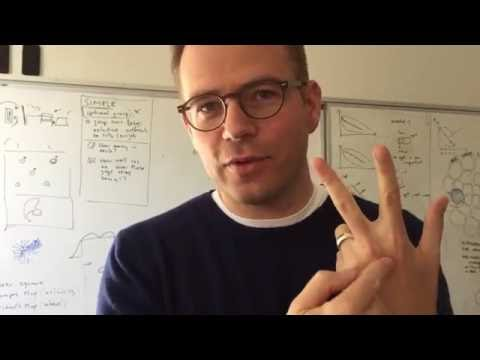

In [2]:
from IPython.display import YouTubeVideo
YouTubeVideo("qjM9yMarl70",width=800, height=450)

> **_Video Lecture_**. Then check out a few comments on ["Network Notation"](https://youtu.be/MMziC5xktHs). 

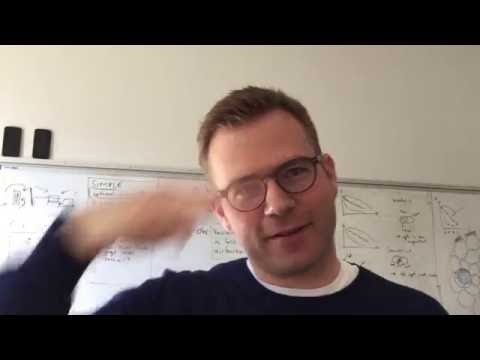

In [3]:
YouTubeVideo("MMziC5xktHs",width=800, height=450)

> _Reading_. We'll be reading the textbook _Network Science_ (NS) by Laszlo Barabasi. You can read the whole 
> thing for free [**here**](http://barabasi.com/networksciencebook/). 
> 
> * Read chapter 1\.
> * Read chapter 2\.
> 

> _Exercises_  
> _Chapter 1_ (Don't forget that you should be answering these in a Jupyter notebook.) 
> 
> * List three different real networks and state the nodes and links for each of them.
> * Tell us of the network you are personally most interested in. Address the following questions:
>   * What are its nodes and links? 
>   * How large is it? 
>   * Can be mapped out? 
>   * Why do you care about it? 
> * In your view what would be the area where network science could have the biggest impact in the next decade? Explain your answer - and base it on the text in the book. 
> 
> _Chapter 2_
> 
> * Section 2.5 states that real networks are sparse. Can you think of a real network where each node has _many_ connections? Is that network still sparse? If yes, can you explain why?
> 
> There are more questions on Chapter 2 below.
> 

### Three diffent networks

**Friend networks**: On facebook or the like, the nodes are people, the links are friendships

**NFT trades** The nodes at owners the links are the transfer of NFTs between them

**Public transport connections** The nodes are stations, the links are 


# Part 2: Exercises using the `NetworkX` library

We will analyse networks in Python using the [NetworkX](https://networkx.org/) library. The cool thing about networkx is that it includes a lot of algorithms and metrics for analysing networks, so you don't have to code things from scratch. Get started by running the magic ``pip install networkx`` command. Then, get familiar with the library through the following exercises: 

>  *Exercises*:

> * Go to the NetworkX project's [tutorial page](https://networkx.org/documentation/stable/tutorial.html). The goal of this exercise is to create your own notebook that contains the entire tutorial. You're free to add your own (e.g. shorter) comments in place of the ones in the official tutorial - and change the code to make it your own where ever it makes sense.
> * Go to Section 2.12: [Homework](http://networksciencebook.com/chapter/2#homework2), then
>     * Write the solution for exercise 2.1 (the 'Königsberg Problem') from NS in your notebook.
>     * Solve exercise 2.3 ('Graph representation') from NS using NetworkX in your notebook. (You don't have to solve the last sub-question about cycles of length 4 ... but I'll be impressed if you do it).
>     * Solve exercise 2.5 ('Bipartite Networks') from NS using NetworkX in your notebook.

# Part 3: Building the GME redditors network

Ok, enough with theory :) It is time to go back to our cool dataset it took us so much pain to download! And guess what? We will build the network of GME Redditors. Then, we will use some Network Science to study some of its properties.


> 
> *Exercise*: Build the network of Redditors discussing about GME on r\wallstreetbets. In this network, nodes correspond to authors of comments, and a direct link going from node _A_ to node _B_ exists if _A_ ever answered a submission or a comment by _B_. The weight on the link corresponds to the number of times _A_ answered _B_. You can build the network as follows:
>
> 1. Open the _comments dataset_ and the _submission datasets_ (the first contains all the comments and the second cointains all the submissions) and store them in two Pandas DataFrames.
> 2. Create three dictionaries, using the command ``dict(zip(keys,values))``, where keys and values are columns in your dataframes. The three dictionaries are the following:
>     * __comment_authors__: (_comment id_, _comment author_)
>     * __parent__:  (_comment id_ , _parent id_)
>     * __submission_authors__: (_submission id_, _submission author_)
>
> where above I indicated the (key, value) tuples contained in each dictionary.
>
> 3. Create a function that take as input a _comment id_ and outputs the author of its parent. The function does two things:
>     * First, it calls the dictionary __parent__, to find the _parent id_ of the comment identified by a given _comment id_. 
>     * Then, it finds the author of  _parent id_. 
>          * if the _parent id_ starts with "t1_", call the __comment_authors__ dictionary (for key=parent_id[3:])
>          * if the _parent id_ starts with "t3_", call the __submission_authors__ dictionars (for key=parent_id[3:])
>
> where by parent_id[3:], I mean that the first three charachters of the _parent id_ (either "t1_" or "t3_" should be ingnored).
>
> 4. Apply the function you created in step 3. to all the comment ids in your comments dataframe. Store the output in a new column, _"parent author"_, of the comments dataframe. 
> 5. For now, we will focus on the genesis of the GME community on Reddit, before all the hype started and many new redditors jumped on board. For this reason, __filter all the comments written before Dec 31st, 2020__. Also, remove deleted users by filtering all comments whose author or parent author is equal to "[deleted]". 
> 6. Create the weighted edge-list of your network as follows: consider all comments (after applying the filtering step above), groupby ("_author_", _"parent author"_) and count. 
> 7. Create a [``DiGraph``](https://networkx.org/documentation/stable//reference/classes/digraph.html) using networkx. Then, use the networkx function [``add_weighted_edges_from``](https://networkx.org/documentation/networkx-1.9/reference/generated/networkx.DiGraph.add_weighted_edges_from.html) to create a weighted, directed, graph starting from the edgelist you created in step 5.
> 8. Save the Network as a json file. 

In [1]:
import os
import pandas as pd
import numpy as np

In [34]:
current_dir = os.getcwd()

comment_data = pd.read_csv(current_dir + '/data_comments.csv')
sub_data = pd.read_csv(current_dir  + '/data_subs.csv')

imp_sub_data = np.array(sub_data[['id','author']])

################# FOR TESTING COMPATABILITY OF TWO DATASETS #################

#print("Headers here", comment_data.columns)
#print("Sub headers here", sub_data.columns)

# Remove annyoing 't3_' in front of every link_id on the comments
unique_ids = np.unique(np.array(list(map(lambda x: x[3:], comment_data['link_id']))))

# REALITY CHECK, ARE THERE ACTUALLY ANY THAT MATCH THIS?
#print("RIGHT HERE", np.where(imp_sub_data[:,0] == 'kqzpqu'))

# Create common set holding all unique values for both
#set1 = set(unique_ids)
#set2 = set(imp_sub_data[:,0])
#common_set = set1 & set2

################# ################# ################# ################# #################

# Create three required dictionaries
comment_authors = dict(zip(comment_data['id'], comment_data['author']))
parents = dict(zip(comment_data['id'], comment_data['parent_id']))
sub_authors = dict(zip(sub_data['id'],sub_data['author']))


In [37]:
def get_comment_parent(com_id: str) -> str:
    """
    Return either the sub_author or the comment author of the parent id
    """
    # THERE ARE MISTAKES HERE! JUST IGNORE THE ONES THAT ARE PARENTLESS, WE ARE MISSING SOME OF THE COMMENTS THEY ARE REPLYING TO
    
    
    parent_id = parents[com_id]

    if parent_id[0:3] == 't3_':
        try:
            return sub_authors[parent_id[3:]]
        except KeyError:
            pass
    
    elif parent_id[0:3] == 't1_':
        try:
            return comment_authors[parent_id[3:]]
        except KeyError:
            pass

In [38]:
for comment_id in comment_data['id']:
    print(get_comment_parent(comment_id))

tepchan
tepchan
tepchan
tepchan
tepchan
tepchan
tepchan
tepchan
tepchan
tepchan
tepchan
tepchan
tepchan
RemindMeBot
DonaldTrumpIsTupac
None
None
None
OhSoRefreshing
OhSoRefreshing
itsonlyfiat
heatnation7
heatnation7
itsonlyfiat
NoNutNovermber42069
None
tiejcsi
None
tiejcsi
tiejcsi
DarkCaptain
None
gardeeon
FartSpeller
None
None
Wasabii12315
bigcockmoney69
Wasabii12315
Wasabii12315
Wasabii12315
bigcockmoney69
Wasabii12315
None
None
wanna_fuck_my_GF
DEVolkan
None
None
None
specspecspec
specspecspec
specspecspec
specspecspec
None
thespiffydentist
Foreign-Local
None
None
None
specspecspec
specspecspec
specspecspec
specspecspec
specspecspec
eagseagle
billswinter
Realistic-Account-55
toothierlake8
NarrowBoatLover
MeetDeath
NarrowBoatLover
NarrowBoatLover
NarrowBoatLover
NarrowBoatLover
NarrowBoatLover
NarrowBoatLover
rugbygod69
NarrowBoatLover
NarrowBoatLover
None
NarrowBoatLover
None
socialistrob
None
potatoandbiscuit
Averos_
applebrother
applebrother
None
BlazingLeo
Anon-1400secret
The_cre

420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
trustworthydude
ProbablyTrolling1
Sicotic87
aLANparty
aLANparty
Sicotic87
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
ProbablyTrolling1
earlyretirement
sunchaser91
420_PUSSY_SLAYER_69
leonardoswans
aLANparty
420_PUSSY_SLAYER_69
saeed47
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
upsidedownpenguin96
420_PUSSY_SLAYER_69
yaboired97
ProbablyTrolling1
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
upsidedownpenguin96
Hookers-n-options
loupanner
upsidedownpenguin96
420_PUSSY_SLAYER_69
ballgooch
trustworthydude
ballgooch
420_PUSSY_SLAYER_69
yeti900513
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
tbeck_33
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
genericQuery
saucydeath
420_PUSSY_SLAYER_69
saucydeath
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69
420_PUSSY_SLAYER_69


kytran40
meta-cognizant
redroverster
meta-cognizant
Jacked2thetitts
meta-cognizant
meta-cognizant
potspands
potspands
[deleted]
ProfessorPicklez
KaposGetOut
AutoModerator
meta-cognizant
meta-cognizant
meta-cognizant
pedrollpalma
cyberst0rm
meta-cognizant
meta-cognizant
amagadon
meta-cognizant
Minimum-Watercress-8
meta-cognizant
potspands
RobertPaulsonXX42
meta-cognizant
My42069thredditacct
My42069thredditacct
meta-cognizant
tipsyvirus
meta-cognizant
meta-cognizant
meta-cognizant
lankyyanky
meta-cognizant
meta-cognizant
RobertPaulsonXX42
benttwig33
meta-cognizant
meta-cognizant
meta-cognizant
meta-cognizant
zjz
filterface
meta-cognizant
Tsukune_Surprise
Green_Lantern_4vr
meta-cognizant
TheModeratorWrangler
mpwrd
SuperGhozt
TheNothingKing
meta-cognizant
redroverster
meta-cognizant
meta-cognizant
Say_no_to_doritos
meta-cognizant
ksx25
benfrank1in
KaposGetOut
RobertPaulsonXX42
beecums
meta-cognizant
LiquorLanch
None
meta-cognizant
Minimum-Watercress-8
oliv2852
meta-cognizant
meta-cognizant

roadtoriches92
GayPornEnthusiast
MadeTheAccountForWSB
eliteHaxxxor
MadeTheAccountForWSB
MadeTheAccountForWSB
MadeTheAccountForWSB
EducatedFool1
MadeTheAccountForWSB
FatAspirations
eliteHaxxxor
cheesenuggets2003
palmallamakarmafarma
DingLeiGorFei
XxpapiXx69
pandemichael
StillCharging
tcobbets10
bisnexu
VastFreedom7
MadeTheAccountForWSB
MadeTheAccountForWSB
MadeTheAccountForWSB
MadeTheAccountForWSB
MadeTheAccountForWSB
MadeTheAccountForWSB
EroticVelour
last-resort-4-a-gf
Waste-Economics6914
Anonymous_Snow
MadeTheAccountForWSB
GayPornEnthusiast
MadeTheAccountForWSB
MadeTheAccountForWSB
MadeTheAccountForWSB
MadeTheAccountForWSB
Waste-Economics6914
Im_Tele
lethal3185
MadeTheAccountForWSB
JapanesePeso
Waste-Economics6914
MadeTheAccountForWSB
[deleted]
MadeTheAccountForWSB
lethal3185
Jaboris_Bongo
Anonymous_Snow
MadeTheAccountForWSB
lethal3185
MadeTheAccountForWSB
shadowderp
MadeTheAccountForWSB
Stonkologist_MD
runitupmikey
MadeTheAccountForWSB
EducatedFool1
MadeTheAccountForWSB
lethal3185
Al

psytokine_storm
psytokine_storm
psytokine_storm
psytokine_storm
rjl603
Hitler_wuz_socialist
eggfriedbryce
[deleted]
MaesterJones
FabulousStomach
None
None
kytran40
psytokine_storm
hella_pinoy
bearshark713
nonhiphipster
Apollo_Thunderlipps
psytokine_storm
MuzzyIsMe
None
psytokine_storm
Hitler_wuz_socialist
H-Doggy
Pippen225
psytokine_storm
jumpthroughit
bignewsforyou
BETmyhoeonTesla
psytokine_storm
None
KR6363
ctoomer
RainbowKoi
Joeribouwer
hockeyiscool2018
InfamousAbe
CriticDanger
Skateboard_Raptor
bonnnquiqui69
Invictae
psytokine_storm
None
Bossman-007
psytokine_storm
psytokine_storm
frame_of_mind
No_Trade1424
hammeroutremodels
NotLarryT
KR6363
mattstover83
nonhiphipster
taddymason_22
Lockaz
ProbablyTrolling1
Darkbyte
psytokine_storm
sjtomcat
HilloHoHo
StopVibin
Hav3y
SluggBugg24
DinoTh3Dinosaur
InfamousAbe
bitzap_sr
NotLarryT
CD2471
Mong0saurus
bigboxybimboschlimbo
psytokine_storm
-remlap
Bendetto4
psytokine_storm
psytokine_storm
Smirkydarkdude
SwoleJohll
psytokine_storm
SwoleJohll
M

Rolltide-tolietpaper
baws1017
AutoModerator
ethandavid
None
Hitler_wuz_socialist
Rolltide-tolietpaper
Rolltide-tolietpaper
PRPL_Nurple
OptionsTrader101
UncleZiggy
Rolltide-tolietpaper
ropahektic
ethandavid
Alostsock
None
MuzzyIsMe
haleykohr
pwd9398
Rolltide-tolietpaper
namrock23
keysworld253
Tree_house_cake
Rolltide-tolietpaper
Last_Sheep_Investor
Alostsock
HardtackOrange
Last_Sheep_Investor
confusedhouseplants
bridgeheadone
loose-ventures
peace_seeker007
KingSkegness
Fywsm
Dirtyramm
Jack-Skinne
Dirtyramm
confusedhouseplants
[deleted]
WheelerDan
swanpenguin
MentaSuave
None
OnelungBL
None
MustardyAustin
MustardyAustin
Fywsm
thefract0metr1st
keysworld253
keysworld253
None
Rolltide-tolietpaper
MustardyAustin
MustardyAustin
Physcodbzfan85
swanpenguin
OnelungBL
swanpenguin
swanpenguin
Rolltide-tolietpaper
Lumpy_Cryptographer6
ModernJesus42
potatoclump
None
PRPL_Nurple
None
Rolltide-tolietpaper
Dufort617
confusedhouseplants
None
None
Rolltide-tolietpaper
None
OptionsTrader101
Rolltide-toliet

NathanGorgeous
MrUnp0pular0pini0n
trustworthydude
Gymnast_SRY
arzelr
arzelr
hidden_admin
MrUnp0pular0pini0n
MrUnp0pular0pini0n
FuzzyDuck85
arzelr
arzelr
hidden_admin
arzelr
arzelr
arzelr
justusingredditUSA
hinkyhonky
MrUnp0pular0pini0n
justusingredditUSA
FuzzyDuck85
arzelr
LinuxF4n
arzelr
arzelr
arzelr
arzelr
arzelr
arzelr
arzelr
arzelr
MrUnp0pular0pini0n
arzelr
arzelr
arzelr
arzelr
arzelr
arzelr
arzelr
hinkyhonky
arzelr
arzelr
arzelr
arzelr
arzelr
arzelr
arzelr
lonedirewolf21
PM_ME_TENDIEZ
pecarlo
lonedirewolf21
ballgooch
tldrtldrtldr
serkrabat
[deleted]
Yongmoolah
Iraquiano
serkrabat
None
Iraquiano
tldrtldrtldr
pecarlo
pecarlo
pecarlo
pecarlo
pecarlo
yolocr8m8
pecarlo
tldrtldrtldr
serkrabat
tldrtldrtldr
tldrtldrtldr
tldrtldrtldr
Darnuld
tldrtldrtldr
tldrtldrtldr
ExoticDankOnly
vashais
tldrtldrtldr
tldrtldrtldr
ballgooch
tldrtldrtldr
mikemakesit
Fibrosis5O
Liuminescent
Backabeyond77
1enlightenment
1enlightenment
unnecessarychaos
zeusthunder
bigblackshaq
Boy_Boss
zeusthunder
daviid219


CompressionNull
secretsodapop
IHaveBadPenis
OneCoolGhoul
Surface_Crab
OysterTrapGW
canadaornot
high_class_autist
Foman1231
secretsodapop
hiddenemi
hb_315
hb_315
mavestic
Lyeanel
vigouroflatis
SeaWin5464
hb_315
None
wanna_fuck_my_GF
1_N_2_3_4_5_6
DrHeadBeeGuy
fieryskyes
Lyeanel
tetonHiker86
saintmesss
hb_315
secretsodapop
krootzl88
hb_315
Healthy_Radish
[deleted]
hb_315
InvincibearREAL
BurtMacklin____FBI
909side
pjarmes
Surface_Crab
hb_315
I_am_salad
microphaser
hb_315
krootzl88
hb_315
Call_Me_Ryan
Surface_Crab
vigouroflatis
hb_315
wanna_fuck_my_GF
fractalducks
PeytonManThing0
shogun_
hb_315
Call_Me_Ryan
Bird3x6
hb_315
Riotwithgaming
franticsoftware
hb_315
hb_315
smarent
Fair-Cobbler8694
hb_315
chrswnd
hb_315
shogun_
hb_315
hb_315
hb_315
z1zonly
hb_315
Gorillafist89
hb_315
hb_315
hb_315
Lyeanel
yolotrumpbucks
Gray_FoxSW20
Expensive-Square8595
aolawaymessage
TUKKS11
hb_315
Fair-Cobbler8694
TUKKS11
RedditAnalystsLULW
hb_315
chrswnd
WillSpur
None
Lyeanel
Bloody_sock_puppet
hb_315
Fair-Cobb

upintheaireeee
upintheaireeee
upintheaireeee
upintheaireeee
Nameless739
Nameless739
tortoisepump
Upper_Departure_1198
badfps123
Upper_Departure_1198
Upper_Departure_1198
RoosterBoy912
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
itsmillertime512
Upper_Departure_1198
Upper_Departure_1198
WestWater6
TheSyrupCompany
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
squomm
T-R-A-D-E-R
Upper_Departure_1198
CollegeInsider2000
CollegeInsider2000
Fixedgearmike
Upper_Departure_1198
T-R-A-D-E-R
Upper_Departure_1198
Upper_Departure_1198
None
beamerBoy3
Upper_Departure_1198
Upper_Departure_1198
Upper_Departure_1198
ChungWSB
Upper_Departure_1198
smskin1
thetotalpackage7
Kepnut-
WaitingForAHairCut
i_accidently_reddit
GayPornEnthusiast
i_accid

HelloImustbegoing
HelloImustbegoing
HelloImustbegoing
mixedthadd
mixedthadd
mixedthadd
sharkygofast
cruxianpal
cruxianpal
sharkygofast
Chuggz18
lostwanderings
tressan
cruxianpal
tressan
cruxianpal
cruxianpal
cruxianpal
cruxianpal
cruxianpal
javawitherspoon
javawitherspoon
cruxianpal
cruxianpal
wawrzuu
barnabywild
wawrzuu
[deleted]
ComfortableJaguar341
ComfortableJaguar341
[deleted]
[deleted]
ComfortableJaguar341
ComfortableJaguar341
[deleted]
ComfortableJaguar341
None
TheCaddisLattice
Affectionate_Loss557
[deleted]
barnabywild
nikolaichev
ComfortableJaguar341
touchymacaroons
[deleted]
ComfortableJaguar341
Arugula_Infamous
TheCaddisLattice
ComfortableJaguar341
TheCaddisLattice
barnabywild
[deleted]
stopearthmachine
MrIcedCafeMocha
[deleted]
MrIcedCafeMocha
TheCaddisLattice
stopearthmachine
[deleted]
stopearthmachine
[deleted]
barnabywild
PunkNDisorderlyGamer
TheCaddisLattice
barnabywild
TheCaddisLattice
nikolaichev
barnabywild
nikolaichev
nikolaichev
TheCaddisLattice
TheCaddisLattice
ni

stonkinverser
stonkinverser
stonkinverser
jsidx
unnecessarychaos
claudeaug86
Analyst214
stonkinverser
stonkinverser
ndawgkrunk
Realistic-Account-55
stonkinverser
stonkinverser
roosly
stonkinverser
stonkinverser
Realistic-Account-55
stonkinverser
BETmyhoeonTesla
ndawgkrunk
Nikla436
stonkinverser
terrible_badguy
ndawgkrunk
AutoModerator
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
stonkinverser
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbies
iusedtofuckmyferbie

Dante451
dealofjoy
OgreAllOver
jager_mcjagerface
t3amkill
Dsphar
Bendetto4
Jomtung
MrIcedCafeMocha
ThatsUnbelievable
WeAreTheAIs
EntertainmentNo5928
Aznfellow
Frostcrest
XtheLizardKing
Boner4Stoners
larrykeras
None
fieryskyes
mojool
Dante451
Megahuts
Novast
doomgrin
None
Grampz03
dealofjoy
None
bombduck
fieryskyes
DarkBlaze99
Dsphar
Cycles_wp
None
Bendetto4
InvincibearREAL
fieryskyes
None
jjefers123321
AyyyyyyyLemao
fieryskyes
fieryskyes
rrdein
PurpleDaphne
0Bubs0
fieryskyes
fieryskyes
pewwpewpew
DarkBlaze99
Besthookerintown
MrIcedCafeMocha
Jwaness
fieryskyes
bukake_master
jager_mcjagerface
None
___Big_Bird___
HotStool
AyyyyyyyLemao
obeseFIREwannabe
lynch0211
MrIcedCafeMocha
jager_mcjagerface
Anson845
HelpfulCherry
Rezadu
spritezeros
NaughtyKatsuragi
spritezeros
None
aka_FunkyChicken
My42069thredditacct
Bendetto4
JeecooDragon
fieryskyes
spritezeros
None
None
fieryskyes
koolvik91
spritezeros
Megahuts
radaway1
fieryskyes
Gravitahs
ProbablyTrolling1
fieryskyes
fieryskyes
degenerashunx
fie

OPINION_IS_UNPOPULAR
mixmasterJ08
HWPO1
UsernameTaken_123
OPINION_IS_UNPOPULAR
skytrooper77
-Rickety-
OPINION_IS_UNPOPULAR
LMY723
PhuckMikeHunt
Odd_Ad4135
ilovemydogs__
OPINION_IS_UNPOPULAR
-Rickety-
p4rty_sl0th
roejieks
minttoastjr
-Rickety-
OPINION_IS_UNPOPULAR
LMY723
dankbudzz
OPINION_IS_UNPOPULAR
Lakeakers
HappyDaysMyDays
PowerHausMachine
-Rickety-
thor-ragnorcock
Claim-90
ilovemydogs__
yermanthere86
doomgrin
BuonOrator
WillNeighbor
timiking
OPINION_IS_UNPOPULAR
prettygurl_xoxo_luv
varackobama
Atykus
OPINION_IS_UNPOPULAR
PhuckMikeHunt
AznChubbychub
roejieks
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
Consistent-Cap3330
GottaBeMadeOfMilo
KnightCreator64
Michigander819
roejieks
skytrooper77
ModeratelyTortoise
Requonio
Rangeninc
roejieks
FakeAre
PowerHausMachine
BuonOrator
OPINION_IS_UNPOPULAR
PeytonManThing0
UsernameTaken_123
Jaguar_556
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
Gahquandri
manbeef
marshfacekillahi5
ilovemydogs__
PeterPacker
ilovemydogs__
watrshed
xavierelon
AnomolousAno

Cptn_Canada
OPINION_IS_UNPOPULAR
lachlandoc
OPINION_IS_UNPOPULAR
[deleted]
ak22801
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
ak22801
evilvyse
wisdom_power_courage
vyts18
[deleted]
-NotEvenMyFinalForm-
OPINION_IS_UNPOPULAR
FirmInfluence5689
alterexego
stevejobswasmurdered
OPINION_IS_UNPOPULAR
Blackpixels
swat71
all-day-every-day
None
SnooWalruses7854
OPINION_IS_UNPOPULAR
None
wisdom_power_courage
ak22801
OPINION_IS_UNPOPULAR
nosalute
Flying_madman
quarantrader
None
OPINION_IS_UNPOPULAR
stevejobswasmurdered
Rangeninc
Dark_Tigger
nosalute
OPINION_IS_UNPOPULAR
JhoLow_1MDB
ak22801
ak22801
pierdolenierobie
sauce-miyagi
t3amkill
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
nosalute
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
wisdom_power_courage
None
Freestyle_Fellowship
OPINION_IS_UNPOPULAR
stevejobswasmurdered
boiledpeen
AdmirableScientist21
ak22801
JhoLow_1MDB
stevejobswasmurdered
JhoLow_1MDB
quarantrader
graham0025
FirmInfluence5689
JhoLow_1MDB
JhoLow_1MDB
Impossible_Average83
OPINION_IS_UNPOP

load2010
tkotter24
enocules
jdme1
rustyham
Wlpxx7
OPINION_IS_UNPOPULAR
alpha-morph
HwatBobbyBoy
WhatsMyMDA
Besthookerintown
OPINION_IS_UNPOPULAR
WhatsMyMDA
SolidLikeIraq
hashslinging-slash
DeathToTheDay
Boring-Arachnid-7039
borisjjjj
Boring-Arachnid-7039
Freestyle_Fellowship
cevin_khan
o0DrWurm0o
Goober-Ryan
TheFlightlessPenguin
2_The_Mooon
2_The_Mooon
load2010
acct18363
Crazyhates
RobBobheimer
unspeakablepile
nectarinequeen345
djloky16
Freestyle_Fellowship
Michael12390
None
OPINION_IS_UNPOPULAR
emacudub
j_rapp
the_opester
the_opester
hashslinging-slash
WallStreetRetardd
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
player2
justinbting30
OPINION_IS_UNPOPULAR
MCS117
Souk12
hashslinging-slash
2_The_Mooon
[deleted]
t3amkill
the_opester
hashslinging-slash
OPINION_IS_UNPOPULAR
2_The_Mooon
PlanesAreCool
stopearthmachine
OPINION_IS_UNPOPULAR
peeptheblitz
Yourmommadepancakes
OPINION_IS_UNPOPULAR
m012892
OPINION_IS_UNPOPULAR
tmoeagles96
AutoModerator
Michael12390
OPINION_IS_UNPOPULAR
2_The_Mooon
2_

F0r_Th3_W1n
MemesXD420
chedrich446
Futures2004
OPINION_IS_UNPOPULAR
None
BedRoomAmpMan
OPINION_IS_UNPOPULAR
GoatSmooth7809
OPINION_IS_UNPOPULAR
pierdolenierobie
OPINION_IS_UNPOPULAR
daniel4072305
redditposter-_-
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
123ocelot
edible_scissors
OPINION_IS_UNPOPULAR
cevin_khan
OPINION_IS_UNPOPULAR
None
OPINION_IS_UNPOPULAR
zeehrob
OPINION_IS_UNPOPULAR
xUberAnts
Futures2004
bocephus67
Truthposter100
Pesime
catxav
chedrich446
Sad-Side-8704
AznChubbychub
HolyHarmony
OPINION_IS_UNPOPULAR
None
OPINION_IS_UNPOPULAR
None
OPINION_IS_UNPOPULAR
dirtyshits
None
BedRoomAmpMan
OPINION_IS_UNPOPULAR
c2___
t3amkill
c2___
PlzbuffRakiThenNerf
hedgeh0g_pie
chedrich446
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
nosalute
namrock23
OPINION_IS_UNPOPULAR
WilleZumLeben
OPINION_IS_UNPOPULAR
daniel4072305
c2___
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
callofthevoid_
Fvennris
[deleted]
FancyBoiMusic
OPINION_IS_UNPOPULAR
thanlon5
imincarnate
EternallyRich
lohith15
plackatack
OPINI

MrHockey95
kewkkid
Particular-Wedding
Gregrom26
Kanye4President69
negan90
dreadstrong97
tomwdance
CultofCedar
maxwellt1996
OPINION_IS_UNPOPULAR
Lil_Pump_Jetski
Moist_Vanguard
bboy2143
bboy2143
Requonio
MangoManYummy
OPINION_IS_UNPOPULAR
[deleted]
bigpapa729
Lil_Pump_Jetski
[deleted]
nosalute
pixelwalrusca
OPINION_IS_UNPOPULAR
MangoManYummy
OPINION_IS_UNPOPULAR
kabobkabobkabob
MangoManYummy
OPINION_IS_UNPOPULAR
Kwaddell97
synapsesynopsis
OPINION_IS_UNPOPULAR
ApprehensiveBelt6108
tryingtolearnitall
justherefortheturnip
ApprehensiveBelt6108
energetic-dad
Chan1991
Aretaxios
Lil_Pump_Jetski
WallStreetRetardd
OPINION_IS_UNPOPULAR
zyxzyxzyxzyxzyxzyxz
OPINION_IS_UNPOPULAR
pixelwalrusca
OPINION_IS_UNPOPULAR
lotrmemescallsforaid
Cattlepult
ryanhulett
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
None
ryanhulett
phoenixmusicman
Requonio
m012892
cjbrigol
phoenixmusicman
Huddstang
Dan_Chan_NA
admijn
MrNewMoney
puppy_master666
Cattlepult
None
OPINION_IS_UNPOPULAR
bigpapa729
nosalute
GroverGoneMad4
nosal

DeepFuckingValue
DeepFuckingValue
leftunderground
DeepFuckingValue
FullMTLjacket
imunfair
v1sskiss
DeepFuckingValue
wallawalla_
Winzip115
DeepFuckingValue
ArgenTravis
DeepFuckingValue
thefract0metr1st
Frank_JWilson
DeepFuckingValue
ArcadianGhost
Winzip115
walabie
suhayma
kit_starman
TRUMP420KUSH_
Afghanpapi
DeepFuckingValue
DeepFuckingValue
360012
thethrifter
-ksguy-
TerrorSuspect
DeepFuckingValue
DeepFuckingValue
ReduxAssassin
BeetrootKid
melanthius
dum_townerino
lhturbo
Redditor45643335
imajackoffalltrades
BeetrootKid
DeepFuckingValue
TRUMP420KUSH_
newuser201890
DeepFuckingValue
-ksguy-
DeepFuckingValue
DeepFuckingValue
PopLegion
Sharkcity215
yourbraindead
Zurkarak
__TIE_Guy
be_easy_1602
OCOWAx
DeepFuckingValue
Winzip115
TRUMPDOMINATES
DeepFuckingValue
DeepFuckingValue
DingLeiGorFei
dum_townerino
leftunderground
MeLongYouLongTime
DeepFuckingValue
[deleted]
TRUMP420KUSH_
[deleted]
Otherwise-Luck-9446
Winzip115
Burningwood69
TRUMP420KUSH_
DeepFuckingValue
ADB963
Jack_Schiett
Jack_Schie

DeepFuckingValue
DeepFuckingValue
JB4GDI
theinquisition
-ksguy-
sobabe
Punch_Tornado
freehouse_throwaway
DeepFuckingValue
edevSaaS
tobster87
DeepFuckingValue
DeepFuckingValue
None
-ksguy-
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
qning
DeepFuckingValue
DeepFuckingValue
ADB963
Winzip115
-ksguy-
triple_verbosity
DM-ME-CONFESSIONS
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
borisjjjj
TrueDeceiver
DeepFuckingValue
DeepFuckingValue
JB4GDI
DeepFuckingValue
[deleted]
gwh21
DeepFuckingValue
KarmaPoIice
DeepFuckingValue
5degreenegativerake
thefract0metr1st
kashkash21
degenerashunx
DeepFuckingValue
banditcleaner2
DeepFuckingValue
DeepFuckingValue
jumpthroughit
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
chabrah19
-ksguy-
csharpminor5th
edevSaaS
MrMindwaves
bobcats2019
csharpminor5th
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
RogerPackinrod
GreyMatter22
kylesbadatprivacy
DegenerateCharizard
Horror_Car_8005
Drfoxi
TRUMP420KUSH_
thefr

trowed
trowed
paulmates10
trowed
trowed
trowed
xReapzAT
trowed
trowed
KevTr
trowed
trowed
jobyhill
trowed
yucatan36
Maximum_Maximist
trowed
trowed
Besthookerintown
browncoats4lyfe
trowed
trowed
trowed
Butthole--pleasures
xReapzAT
trowed
trowed
trowed
trowed
trowed
trowed
trowed
summersss
trowed
LifeSizedPikachu
trowed
trowed
trowed
trowed
trowed
trowed
trowed
trowed
SeeMontgomeryBurns
trowed
trowed
trowed
trowed
trowed
trowed
trowed
trowed
trowed
trowed
None
Last12theParty
trowed
trowed
trowed
GeneEnvironmental925
kenchin123
trowed
trowed
xReapzAT
JerHair
dudesmokeweed
trowed
trowed
trowed
paulmates10
trowed
trowed
trowed
trowed
trowed
trowed
trowed
trowed
trowed
DickInAToaster
DickInAToaster
dnr41418
dnr41418
dnr41418
dnr41418
dnr41418
dnr41418
dnr41418
Waste-Economics6914
nateyp123
Yoshimadashi
Yoshimadashi
Yoshimadashi
JazzlikeDevelopment4
Senguin117
corbinsc35
corbinsc35
ConBroMitch
RC35105TC1
RC35105TC1
RC35105TC1
corbinsc35
corbinsc35
corbinsc35
corbinsc35
razorteddy
corbinsc35
c

kaiwen1007
[deleted]
kaiwen1007
[deleted]
[deleted]
kaiwen1007
[deleted]
kaiwen1007
[deleted]
kaiwen1007
pfai
kaiwen1007
kaiwen1007
kaiwen1007
kaiwen1007
kaiwen1007
DeepBuddy5
scubakangaroo
scubakangaroo
eltgreigh
DeepBuddy5
DeepBuddy5
DeepBuddy5
Horseman631
DeepBuddy5
scubakangaroo
scubakangaroo
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
BonSwan
DeepBuddy5
h165yy
Nieos
iGauss
EducatedFool1
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
DeepBuddy5
SecretPeanutButter
akklo80
akklo80
akklo80
TickleRevolution
akklo80
akklo80
elliot1246
akklo80
hibbjibbity
akklo80
akklo80
akklo80
ayyayyron
rocnationbrunch
akklo80
ayyayyron
akklo80
akklo80
akklo80
akklo80
akklo80
akklo80
hobelhans
mchrisoo7
mchrisoo7
ZETA_RETICULI_
mchrisoo7
mchrisoo7
mchrisoo7
strike190
mchrisoo7
mchrisoo7
Schytzo
Schytzo
Schytzo
mchrisoo7
Schytzo
mchrisoo7
mchrisoo7
mchrisoo7
mchrisoo7
mchrisoo7
mchrisoo7
mchrisoo7
mchrisoo7
t

pcguywilson
TrippyHipT
DeepValueOptions
Teh-alt-write
DeepValueOptions
DeepValueOptions
Teh-alt-write
TrippyHipT
DeepValueOptions
DeepValueOptions
DeepValueOptions
DeepValueOptions
sunnagoon
VictorianQuarky
VictorianQuarky
VictorianQuarky
VictorianQuarky
VictorianQuarky
Stunning_Scale
VictorianQuarky
Stunning_Scale
VictorianQuarky
VictorianQuarky
acct_NOT_for_porn
acct_NOT_for_porn
EconomyAgency
catamountaineer
fromcj
EconomyAgency
EconomyAgency
EconomyAgency
EconomyAgency
mkbeautiful
pythonqueen1
surehard
TipsyDon
pythonqueen1
TipsyDon
TipsyDon
TipsyDon
TipsyDon
Nonchalont
TipsyDon
TipsyDon
TipsyDon
The4rZzAwakenZ
Nonchalont
TipsyDon
TipsyDon
TipsyDon
TipsyDon
TipsyDon
TipsyDon
TipsyDon
TipsyDon
TipsyDon
TipsyDon
TipsyDon
TipsyDon
WATERmyLOAN
WATERmyLOAN
GreatTraderOnizuka
Nonyakira
Nonyakira
YouAreOnFireMark
YouAreOnFireMark
YouAreOnFireMark
YouAreOnFireMark
Classicx
Classicx
Classicx
Classicx
Classicx
PhatHamWallet
Classicx
The_Vidmaster
Classicx
Classicx
AutoModerator
Classicx
Clas

ITradeBaconFutures
ApprehensiveYeet
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
z1g_z4g
ITradeBaconFutures
ITradeBaconFutures
Kozmik
ITradeBaconFutures
Giantomato
ITradeBaconFutures
z1g_z4g
ITradeBaconFutures
Individual_Error_428
StkOpTaxSF
ITradeBaconFutures
Weird-Lie-3228
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
Kmccabe1213
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
benotaur
streetvoyager
ITradeBaconFutures
Maverik-me
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
codemister99
ITradeBaconFutures
z1g_z4g
ITradeBaconFutures
Strange_Kinder
ITradeBaconFutures
CaptainPoopsock
ITradeBaconFutures
ITradeBaconFutures
plimsickins16978
ITradeBaconFutures
ITradeBaconFutures
Herman999999999
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
Kozmik
ITradeBaconFutures
[deleted]
ITradeBaconFu

ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
MrManh
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
euiv
ITradeBaconFutures
ThePoorProdigy
thaddeus424
guma822
ITradeBaconFutures
guma822
guma822
ITradeBaconFutures
ITradeBaconFutures
IGdzrrt
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
[deleted]
ITradeBaconFutures
ITradeBaconFutures
4f434f5741
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
[deleted]
ITradeBaconFutures
Internal-Team-6856
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
guma822
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
throwaway419681717
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
jcbrown2219
ITradeBaconFutures
ITradeBaconFutures
omidiumrare
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBacon

ollien25
Spac2021
Ahtrophie
Dymethyltryptamin
Dymethyltryptamin
Dymethyltryptamin
Dymethyltryptamin
Dymethyltryptamin
Dymethyltryptamin
Rosath
Rosath
Rosath
Character_Repair661
Rosath
Rosath
Metafu
Tendie_Mullet
[deleted]
fireshot1
Metafu
Metafu
Jon5n0wDrgnFukr
ms80301
Metafu
kisssmysaas
Metafu
Dav244224
Metafu
Look-here-sir
Metafu
P1ne4pple8
[deleted]
rbautz
Ozzyb89
fireshot1
Metafu
Metafu
Metafu
Metafu
Metafu
Metafu
Metafu
Metafu
Metafu
Metafu
Metafu
[deleted]
Metafu
Metafu
Metafu
Metafu
ZEBX_
Metafu
Metafu
Metafu
Metafu
Metafu
Metafu
BingBong-42
Metafu
BingBong-42
Metafu
Metafu
Metafu
Metafu
Metafu
KingTiller
KingTiller
songokulvl4
songokulvl4
songokulvl4
songokulvl4
songokulvl4
Redditor6512
oahk4
songokulvl4
songokulvl4
songokulvl4
Spreading-The-Hate
None
Redditor6512
songokulvl4
songokulvl4
songokulvl4
BBQShoe
songokulvl4
ATLSox87
guttasu
songokulvl4
indirectoday
songokulvl4
guttasu
UsuallyATroll
its_Danik
songokulvl4
songokulvl4
bospipes
None
gr8bhere
songokulvl4
None
songokulvl4

burpgently
mryoda9
Iredditfromwork
mryoda9
None
Vacavillecrawdad
mryoda9
mryoda9
AIVISU
None
Zadreamteam
yahbuoy
None
eazy-yeezy
mryoda9
mryoda9
mryoda9
pyvpx
Eurobros69
HwatBobbyBoy
mryoda9
Kenney420
PapaElonMusk
mryoda9
mryoda9
mryoda9
mryoda9
mryoda9
METAL4_BREAKFST
yahbuoy
mryoda9
Sasha_Storm
mryoda9
mryoda9
None
jccool123
coffeelickerr
kylefichtlerofficial
load2010
mryoda9
mryoda9
mryoda9
mryoda9
mryoda9
jccool123
mryoda9
mryoda9
pchampn
mryoda9
deadzol
ronismycat
None
mryoda9
mryoda9
mryoda9
mryoda9
mryoda9
mryoda9
mryoda9
ronismycat
mryoda9
60ROUNDDRUM
mryoda9
coffeelickerr
Hyptisx
shaun_of_the_south
Alpra_Creem
pyvpx
eazy-yeezy
savingface69420
mryoda9
Sasha_Storm
mryoda9
mryoda9
cesarmac
mryoda9
ronismycat
_daath
Shakados
mryoda9
None
jccool123
clueless_as_fuck
Sasha_Storm
mryoda9
L1ghthung3r
eazy-yeezy
AIVISU
aesu
su5
None
[deleted]
mryoda9
Hyptisx
jccool123
gurugemair
None
Hyptisx
2ero
mryoda9
dildowarrior666
mryoda9
mryoda9
METAL4_BREAKFST
mryoda9
mryoda9
mryoda9
mryoda9
fkm

robot3201
robot3201
Legal_Journalist6123
Legal_Journalist6123
Hanben
chrisc1987
wallthrowawaystreet
robot3201
Parkergranger1
Idontlikeredditors6
robot3201
jimjonesz_2233
None
FishyPower
Hanben
juventinn1897
ChaeLee0830
BleachedTaint
ChaeLee0830
innevets
SuXs
Physcodbzfan85
pierdolenierobie
Hammer_police
Hanben
None
je_veux_sentir
jimjonesz_2233
OurInterface
FishyPower
Sasha_Storm
Hanben
DJ_Cockcummer
Legal_Journalist6123
ChaeLee0830
Hanben
Hanben
Legal_Journalist6123
Legal_Journalist6123
ChaeLee0830
Hanben
ChaeLee0830
Hanben
Hanben
juventinn1897
Physcodbzfan85
Hanben
Hanben
Hanben
ElonMusk-papi-cash
ElonMusk-papi-cash
ElonMusk-papi-cash
ElonMusk-papi-cash
andthensomemore
ton-not
AssyrianOG
Cr1318
Grengster
jaydizl
Financial_Advance_72
2ero
Oxi_Dat_Ion
HippolyteClio
HippolyteClio
ccc2310
ccc2310
angrathias
Oxi_Dat_Ion
DonutLover222
Oxi_Dat_Ion
Oxi_Dat_Ion
cat_legs
calicotrinket
Oxi_Dat_Ion
jaydizl
AssyrianOG
Oxi_Dat_Ion
ccc2310
chaos-observatory
Oxi_Dat_Ion
standardrank7
wertyuio267
sta

grebfar
uncapped
grebfar
grebfar
TurbulentBrief
grebfar
grebfar
grebfar
freehouse_throwaway
grebfar
grebfar
None
grebfar
grebfar
maozebong9000
S2icon
ItstheGermanagain
grebfar
None
grebfar
OPINION_IS_UNPOPULAR
grebfar
grebfar
Forest_Solitaire
OhLookAtMeImSpecial
grebfar
grebfar
None
Forest_Solitaire
grebfar
ActuallyStephen
send_help001
8thSt
industrialbird
OPINION_IS_UNPOPULAR
grebfar
grebfar
Idunaz
S2icon
OPINION_IS_UNPOPULAR
grebfar
grebfar
Buraguta
FakeNorseGod
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
S2icon
grebfar
watrshed
another_day_in
Phlebotanist
grebfar
send_help001
grebfar
grebfar
Phlebotanist
JiggaDo
grebfar
grebfar
maozebong9000
radaway1
DisastrousMonk3
send_help001
OPINION_IS_UNPOPULAR
Forest_Solitaire
grebfar
grebfar
grebfar
grebfar
grebfar
rjl603
grebfar
OPINION_IS_UNPOPULAR
grebfar
Forest_Solitaire
grebfar
swgellis
maozebong9000
grebfar
send_help001
abiernat2
Christos_GR
grebfar
GhostofBobStoops
grebfar
grebfar
Pixelated_Fudge
S2icon
grebfar
Forest_Solit

grebfar
grebfar
HonestManufacturer1
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Wood_Rogue
youngheezy44
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Icebreaker80
pokejock
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
[deleted]
grebfar
grebfar
grebfar
grebfar
Cre8or_1
grebfar
grebfar
grebfar
grebfar
grebfar
CrToTheRight
grebfar
choppamandown
grebfar
grebfar
grebfar
grebfar
grebfar
East-Win7450
grebfar
grebfar
ladybugbk
grebfar
grebfar
grebfar
grebfar
grebfar
[deleted]
grebfar
grebfar
grebfar
grebfar
grebfar
AllMight1
grebfar
Malyncore
UnconvincinglyGay
grebfar
grebfar
stopearthmachine
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
gre

Thiccfup
grebfar
Thiccfup
grebfar
grebfar
agnostic_science
EP40BestInDaLee
larrykeras
grebfar
zachjvd
grebfar
gmcarve
None
grebfar
grebfar
grebfar
grebfar
Elonmuskishuman
Pebwainnnn
grebfar
None
grebfar
grebfar
grebfar
Thiccfup
grebfar
FrostyFargoan
Charmcityfuego
Internal-Team-6856
grebfar
scrchr
carbine23
AOpKing
grebfar
Waterbench
grebfar
gmcarve
-NotEvenMyFinalForm-
Nertdy
None
Thiccfup
OctagonNorther
grebfar
None
grebfar
AltruisticPenguin
grebfar
Ayaz28100
grebfar
grebfar
grebfar
grebfar
grebfar
captaindsnuts
grebfar
Thiccfup
grebfar
AOpKing
grebfar
Jacobo_csgo
Jacobo_csgo
grebfar
grebfar
ceimi
Parish87
Thiccfup
grebfar
TallPain9230
DedBeatLebowski
grebfar
TheBlissShow
HWPO1
grebfar
grebfar
Harudera
sojhinn
grebfar
grebfar
PaulGale
grebfar
None
grebfar
grebfar
PencilChant
grebfar
SegundaMortem
EP40BestInDaLee
grebfar
SwedishKillerChef
grebfar
grebfar
grebfar
Seanfeld01
grebfar
Orzorn
callofthevoid_
Average_Noxian
Ayaz28100
Bellweirboy
grebfar
grebfar
None
Status_Ad9874
grebfar
the

overmotion
grebfar
grebfar
grebfar
ak22801
consultinglove
grebfar
Cotton1994
OMGDobbyDied
nslipp
Getting_Involved
grebfar
Cotton1994
grebfar
grebfar
pixelwalrusca
grebfar
grebfar
icedoutlikecomets
grebfar
Cotton1994
nicxxiii
Cotton1994
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
mesegaa
kip256
Vcari
Sandalensamy
grebfar
grebfar
pixelwalrusca
grebfar
grebfar
grebfar
grebfar
Goober-Ryan
grebfar
grebfar
None
grebfar
BUT_THERES_NO_HBO
grebfar
carbine23
zeroviral
grebfar
SkyrimNewb
grebfar
grebfar
BUT_THERES_NO_HBO
mesegaa
grebfar
grebfar
tendiesfortheendies
grebfar
doc_ivo
grebfar
Snarfin
C0013rqu33n
Curryosa
mesegaa
grebfar
grebfar
grebfar
OMGDobbyDied
grebfar
AOpKing
Vcari
grebfar
ValoxHD
Charmcityfuego
grebfar
grebfar
grebfar
MJNGA
grebfar
giantwashcapsfan8
mesegaa
grebfar
KarmaKill23
consultinglove
grebfar
grebfar
ian_v12
AltoidStrong
grebfar
grebfar
grebfar
grebfar
dewck
grebfar
grebfar
grebfar
JakeyYNG
AOpKing
OMGDobbyDied
mesegaa
pierdolenierobie
grebfar
grebfar
consulti

bored765
UABeeezy
grebfar
cognac-n-cannabis
grebfar
Administrative_Ship5
grebfar
izzygonecrazy
grebfar
sveltepants
DegenOptions
tomwdance
grebfar
grebfar
grebfar
grebfar
CommonTwist
grebfar
Blu3Yeti
grebfar
grebfar
grebfar
BlitzComet95
BlitzComet95
dirtbig163
BlitzComet95
grebfar
grebfar
drunkiez
marshfacekillahi5
Zephyr727
izzygonecrazy
BlitzComet95
ohWombats
Odd_Ad4135
Jerseyborn88
bluesohle
apogreba
cxeq
AOpKing
BlitzComet95
grebfar
grebfar
grebfar
grebfar
marshfacekillahi5
None
Administrative_Ship5
None
Odd_Ad4135
grebfar
marshfacekillahi5
BlitzComet95
grebfar
grebfar
grebfar
bigtexas91
grebfar
Odd_Ad4135
BlitzComet95
grebfar
Young_Chung_Tendies
grebfar
None
None
grebfar
Administrative_Ship5
GrantDrexler
GrantDrexler
ohWombats
grebfar
ohWombats
marshfacekillahi5
armored-dinnerjacket
grebfar
grebfar
marshfacekillahi5
grebfar
Blu3Yeti
grebfar
grebfar
bfairrob
[deleted]
None
eatmypis
Odd_Ad4135
brownpm85
grebfar
grebfar
grebfar
grebfar
ktempo
dirtbig163
agentndo
McKimskins
grebfar
mop

thenomadicmonad
grebfar
grebfar
Thereckoning2918
treesandbeers
chrswnd
JoeTrombly
cozyburr
grebfar
grebfar
Ineedmorebtc
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
BusinessManDoBiznez
BusinessManDoBiznez
TheNickSotto
grebfar
grebfar
grebfar
[deleted]
grebfar
Moezuela
grebfar
grebfar
Magoog10
throwawaayy99887711
grebfar
Cyclist_77
fcb403020
grebfar
grebfar
JoeTrombly
GuiltyAffect
sneakizog
anathemalegion
grebfar
grebfar
SnooWalruses7854
grebfar
stay_shiesty
grebfar
MetamorphicRocks
grebfar
Tigerfan0001
chrswnd
eldiablodelafiesta
fcb403020
SHRIEKING_PENIS
SHRIEKING_PENIS
grebfar
grebfar
[deleted]
grebfar
fcb403020
OskiBrah
grebfar
Atheattooist
grebfar
MetamorphicRocks
grebfar
BearPadre
water_is_a_hoax
ripamazon
ripamazon
grebfar
grebfar
grebfar
Nightdocks
zaitsev4
angelsss00
swanpenguin
ATLSox87
roadtoriches92
grebfar
leeljay
BrocMRae
grebfar
grebfar
grebfar
grebfar
grebfar
KyleSNumber3
HeyKidImACommercial
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
None
g

tplee
None
grebfar
grebfar
grebfar
grebfar
quickrivenq
grebfar
grebfar
ThedanishDane
[deleted]
grebfar
grebfar
Regenbooggeit
grebfar
wanna_fuck_my_GF
1ryan_ryan_ryan1
grebfar
CaptainObvious_1
Ok_Storm_2361
grebfar
grebfar
wavey_m8
grebfar
Ok_Storm_2361
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
None
[deleted]
[deleted]
the350candle
grebfar
OskiBrah
CaptainObvious_1
grebfar
Wingnnn
nolitteringplease346
grebfar
grebfar
[deleted]
Zlack50
grebfar
grebfar
grebfar
Ok_Storm_2361
stopearthmachine
grebfar
grebfar
grebfar
M_y_M_u_s_e
idontknowanyonehere1
grebfar
Paniflex
Ok_Storm_2361
grebfar
hockey3331
alwaysreadthename
nicky94
grebfar
grebfar
ian_v12
Beebe82
[deleted]
grebfar
grebfar
1ryan_ryan_ryan1
grebfar
grebfar
TheBlissShow
Brick_Rubin
Kyrtle
69_YOLO_KING_420
grebfar
grebfar
None
grebfar
grebfar
grebfar
grebfar
spacecatJ
grebfar
grebfar
grebfar
GavinFromAutoglass
Kyojuro_Rengoku_
1ryan_ryan_ryan1
Tough-Appearance
grebfar
1ryan_ryan_ryan1
grebfar
Aretaxios
L1ghtn1ng_strike
SHORtThEViX

bizlur
Nearby_Tough7313
grebfar
bigmusclegaybro
bigmusclegaybro
AxleLowe
MortemInferri
grebfar
Imnotabastard22
grebfar
grebfar
None
grebfar
grebfar
86400theta
grebfar
MustngSS
grebfar
Imnotabastard22
sailorjerry888
Imnotabastard22
grebfar
Gahvynn
grebfar
eliminator-n36
IUNOOH
grebfar
grebfar
grebfar
grebfar
shewan3
bigmusclegaybro
grebfar
postulate4
grebfar
dMestra
I_am_TimsGood
grebfar
grebfar
grebfar
grebfar
bizlur
Pixelated_Fudge
None
Additional_Vast_5216
TrippiexJaay
grebfar
grebfar
crackingtosh
grebfar
grebfar
TheSource777
grebfar
None
grebfar
TrippiexJaay
FalconGhost
pirates_and_monkeys
None
grebfar
grebfar
None
grebfar
LightningLegend999
Red_Sea_Pedestrian
arnoldinio
Additional_Problem_1
grebfar
grebfar
grebfar
FreakingOutTheNGHBRD
grebfar
grebfar
FalconGhost
grebfar
vetement
None
Paniflex
callmepookie2
FalconGhost
grebfar
grebfar
Pathological_Liar-
grebfar
bigmusclegaybro
grebfar
coupbrick
[deleted]
grebfar
grebfar
grebfar
OccamsToothpaste
None
asarr016
grebfar
damnfn
grebfar
g

jinxcaitlyn
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
IamTheShrikeAMA
grebfar
grebfar
DonPalme
Riflebursdoe
devbrad
grebfar
grebfar
Jaguar_556
grebfar
remyworldpeace
grebfar
grebfar
grebfar
grebfar
grebfar
devbrad
grebfar
grebfar
IDoLikeMyShishkebabs
grebfar
teddyrosemama
Cptn_Canada
grebfar
grebfar
grebfar
devbrad
devbrad
grebfar
grebfar
grebfar
Riflebursdoe
fromBrandon
Riflebursdoe
grebfar
IamTheShrikeAMA
mcdooglers
Halve_Liter_Jan
grebfar
miselecta
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Th3LichKing
CAMP_ACC
grebfar
kaibasean
None
grebfar
IamTheShrikeAMA
grebfar
grebfar
grebfar
badfps123
themeshuggah
Th3LichKing
Th3LichKing
murph663
grebfar
grebfar
devbrad
devbrad
IamTheShrikeAMA
None
realpersonnn
grebfar
grebfar
grebfar
grebfar
wemissBernieMac
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
devbrad
Honem001
grebfar
grebfar
grebfar
grebfar
ajay27
grebfar
devbrad
Aliu

grebfar
grebfar
grebfar
poor_ves
Imnotabastard22
grebfar
Skwigle
fwoot_fwies
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
FiveHundyByMidnight
corgi_on_a_treadmill
grebfar
grebfar
Asongofparksandrec
grebfar
grebfar
grebfar
Skwigle
grebfar
grebfar
poor_ves
grebfar
grebfar
grebfar
grebfar
grebfar
tucknrobin
grebfar
Imnotabastard22
grebfar
grebfar
fwoot_fwies
grebfar
marcelspencils
grebfar
grebfar
grebfar
grebfar
grebfar
FiveHundyByMidnight
grebfar
grebfar
grebfar
grebfar
corgi_on_a_treadmill
FiveHundyByMidnight
throwaway78907890123
grebfar
fwoot_fwies
grebfar
RadicalMeatBeater
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
jfkah
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
NickTheDick_
kamcg13
grebfar
grebfar
grebfar
grebfar
fwoot_fwies
grebfar
grebfar
fwoot_fwies
grebfar
Imnotabastard22
grebfar
grebfar
grebfar
grebfar
grebfar
Gillky
LongEZE
grebfar
grebfar
grebfar
acid_hoof_
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
gre

grebfar
grebfar
None
grebfar
grebfar
[deleted]
Myfeetaregone
grebfar
textonic
drillteam-six
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
[deleted]
grebfar
grebfar
grebfar
grebfar
grebfar
BanthaKing2012
Aegon21
grebfar
grebfar
grebfar
grebfar
grebfar
ThatMightBeTheCase
CruzControls
grebfar
grebfar
None
grebfar
RedVput
None
grebfar
grebfar
None
LarryIegend
grebfar
grebfar
grebfar
grebfar
grebfar
01928-19912-JK
grebfar
grebfar
dankbob_memepants_
grebfar
grebfar
grebfar
grebfar
AJ45P3R
WorldStarBlackMan
[deleted]
anonkraken
grebfar
sunlir
grebfar
grebfar
grebfar
grebfar
New_Outlandishness6
grebfar
None
grebfar
grebfar
grebfar
josie-gg
grebfar
grebfar
grebfar
grebfar
OhSoScrandy
grebfar
grebfar
grebfar
DenkiAizen
grebfar
textonic
catlady_14
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
One_Professional3734
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
MS14JG-2
grebfar
grebfar
grebfar
[dele

grebfar
grebfar
grebfar
FactAndOrFiction
grebfar
JalYxerf
grebfar
grebfar
grebfar
grebfar
grebfar
wemissBernieMac
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
FactAndOrFiction
grebfar
grebfar
grebfar
grebfar
grebfar
FactAndOrFiction
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
lulu12321cy
UsernameTaken_123
grebfar
grebfar
letzburto
grebfar
letzburto
None
letzburto
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
AIwaysLearning
grebfar
grebfar
grebfar
grebfar
toasted_t_rav
grebfar
grebfar
grebfar
MrChubbb
grebfar
grebfar
grebfar
grebfar
letzburto
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfa

grebfar
grebfar
grebfar
grebfar
None
grebfar
gabs-546
grebfar
grebfar
grebfar
grebfar
grebfar
Bwolfyo
grebfar
Okay_Lawyer
grebfar
TheBirdman100
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
prettygurl_xoxo_luv
grebfar
sadboyverysad
grebfar
DangerousDavey
jazzyjff13
grebfar
grebfar
WorkWeird
grebfar
EAnzy
grebfar
grebfar
grebfar
kikikaxas
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
efandenney
grebfar
grebfar
grebfar
grebfar
sadboyverysad
HornetCandid
grebfar
grebfar
TheBirdman100
grebfar
grebfar
grebfar
hegemonistic
grebfar
Bwolfyo
grebfar
ballmode
grebfar
IRememberThatFace
grebfar
grebfar
sadboyverysad
grebfar
grebfar
grebfar
EmbiidWeTrust
TheBirdman100
MolokaIsMilk
HornetCandid
grebfar
superbuttpiss
gabs-546
grebfar
DarthFedererHA
that_some_good_shit
grebfar
grebfar
Redditor45643335
superbuttpiss
grebfar
goblue2k16
grebfar
grebfar
grebfar
grebfar
roejieks
grebfar
realpotato
None
grebfar
grebfar
LionForest2019
grebfa

oatmilkcortado_
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
NrdRage
grebfar
grebfar
grebfar
Jaguar_556
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Samsonite314
equatecalciumantacid
grebfar
grebfar
grebfar
grebfar
grebfar
Zephyr727
grebfar
grebfar
grebfar
grebfar
grebfar
mecassa
grebfar
grebfar
OkieTaco
grebfar
grebfar
grebfar
LordDegen
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
ButchersClassic
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
RamboWarFace
grebfar
grebfar
Electricengineer
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
gre

grebfar
tendy_capital
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
t-b0ne_pickens
grebfar
grebfar
thebluefish92
grebfar
grebfar
tabbhidigler
grebfar
tabbhidigler
grebfar
grebfar
tabbhidigler
grebfar
grebfar
grebfar
grebfar
tabbhidigler
grebfar
grebfar
grebfar
CitrusAbyss
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
None
Da-Hummus-Amoung-Us
grebfar
Redditor45643335
grebfar
VancouverChubbs
grebfar
grebfar
grebfar
IveOftenSaidThat
Bruins108
FNGmacaroni
grebfar
grebfar
grebfar
grebfar
Altoid_Fanatic
grebfar
MusubiMonster
grebfar
grebfar
grebfar
grebfar
thermalvision
NoahDoesTech
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
DocumentOk2187
grebfar
kingxlos
t-b0ne_pickens
grebfar
grebfar
grebfar
RoguePastaNoodle
grebfar
kikikaxas
None
[deleted]
grebfar
orockers
grebfar
AmadeusK482
grebfar
RetardStockBot
mmillyboi
grebfar
-sr71
OmegaMan_X
grebfar
grebfar
ChickenSandwichGuy
grebfar
[deleted]
DocumentOk2187
jeepers_sheepers
grebfar

grebfar
grebfar
grebfar
pure_me
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
TerranTodd
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
flyrabbit05
grebfar
None
Tscripty
grebfar
Extreme_Pomegranate
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
vicejoebiden3
grebfar
grebfar
grebfar
LewDog1991
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
letskeepthisanon
grebfar
grebfar
grebfar
grebfar
PuhtatoGod
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
PuhtatoGod
grebfar
grebfar
MaxIamIonist
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Neuromantul
hammer_smash_scrotum
pure_me
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
TerranTodd
grebfar
grebfar
grebfar
grebfar
BeverlyLB
grebf

grebfar
None
BobThePineapple
grebfar
grebfar
grebfar
PetiteLumiere
None
grebfar
grebfar
grebfar
Mirucias
grebfar
grebfar
grebfar
grebfar
Schlongus69
BobThePineapple
grebfar
grebfar
grebfar
PM_ME_UR_SEXY_KYLES
daviid219
grebfar
grebfar
grebfar
grebfar
kcrispin2
grebfar
Truthposter100
stopearthmachine
grebfar
grebfar
grebfar
OngoGoblowgian
grebfar
[deleted]
Deep-Mess
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
diewhitegirls
plimsickins16978
grebfar
grebfar
grebfar
grebfar
MySabonerRunsOladipo
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
diewhitegirls
grebfar
grebfar
[deleted]
needlzor
grebfar
grebfar
Mirucias
grebfar
_The_Rooster
grebfar
grebfar
grebfar
LifeOfADarkRose
NecessarySwimming942
grebfar
grebfar
JAnon19
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
perzbenz
grebfar
grebfar
grebfar
BakaSamasenpai
grebfar
Deep-Mess
grebfar
grebfar
Bum_Banditt
grebfar
1florr
BobThePineapple
NicNicD
grebfar
shogun_
grebfar
grebfar
grebfar
grebfar
Themad7
Runster91
BobThePineapple
g

grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Cal4mity
grebfar
grebfar
grebfar
grebfar
grebfar
chinnick967
grebfar
grebfar
Supplementing
grebfar
grebfar
DowntownCharlie
grebfar
grebfar
grebfar
HWPO1
grebfar
grebfar
Sakrie
grebfar
SaltySodomizer
Tsukune_Surprise
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
mr-fiend
grebfar
grebfar
grebfar
grebfar
IWillKarateKickYou
grebfar
grebfar
None
grebfar
grebfar
h0tten
grebfar
grebfar
grebfar
grebfar
grebfar
babalu_babalu
grebfar
5tratton0akMont
grebfar
StateOpposite8345
shadowdylan99
grebfar
grebfar
grebfar
grebfar
Nungie
daymanxx
grebfar
grebfar
[deleted]
grebfar
grebfar
realpersonnn
grebfar
grebfar
grebfar
grebfar
StandardOilCompany
grebfar
kjmarino603
grebfar
grebfar
Marky0choa
grebfar
grebfar
grebfar
grebfar
grebfar
vivzzie
grebfar
Flying_madman
SaltySodomizer
grebfar
grebfar
grebfar
Tyrionical
deegethesqueege
grebfar
grebfar
codemister99
grebfar
grebfar
BadTrad3r
grebfar
grebfar
grebfar
grebfar
grebfar
Sakrie
grebfar
grebfar
grebfar
gre

Assaulted_Fish
grebfar
grebfar
grebfar
grebfar
rhganggang
Assaulted_Fish
aeipownu
grebfar
PetiteLumiere
grebfar
grebfar
Assaulted_Fish
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
chinesebrainslug
grebfar
grebfar
gooseegg101
grebfar
Ohjay420
grebfar
grebfar
benotaur
FayJarner
Affectionate-Shoe-11
grebfar
grebfar
grebfar
aeipownu
grebfar
iceberg247
grebfar
SomaSovari
grebfar
grebfar
grebfar
Assaulted_Fish
grebfar
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
TooDamnThin
grebfar
grebfar
grebfar
Assaulted_Fish
ILikeMyJob69
grebfar
AceCaptainV
grebfar
Semphy
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
PetiteLumiere
ThisIsSalinger
grebfar
grebfar
Mwazoski4
rhganggang
grebfar
grebfar
grebfar
ComeAbout
Kanye4President69
[deleted]
grebfar
grebfar
grebfar
anthonlee
grebfar
grebfar
RamboWarFace
grebfar
grebfar
grebfar
grebfar
Iron_Sheep_
grebfar
Assaulted_

Braza117
grebfar
t3amkill
Mr-Cantaloupe
grebfar
grebfar
TheLeMonkey
grebfar
None
grebfar
mophishstew
grebfar
CALLSORPUT
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
FreqinNVibing
None
grebfar
Objective-Writer-472
grebfar
donny741
ddddope
kioba
-Martinho-
Aromatic-Ad-2095
dirtyshits
grebfar
grebfar
redcedar53
[deleted]
grebfar
FreqinNVibing
Thorgrimm
None
grebfar
None
trixter888
grebfar
grebfar
grebfar
None
OrdinateurBoi
ndntom
kikikaxas
Thorgrimm
siouxu
grebfar
FreqinNVibing
IbarraReddit
grebfar
Peter5815
som3randomgu
grebfar
basedandlinkpilled
grebfar
kioba
Goober-Ryan
thot_tendie
grebfar
grebfar
MoneyEntertainment
kb466
Self-AwareMeat
roadtoriches92
FreqinNVibing
FreqinNVibing
SHRIEKING_PENIS
grebfar
BilllisCool
grebfar
None
cooleschnitte
None
grebfar
Interneter96
Yoshimadashi
grebfar
grebfar
Yoshimadashi
grebfar
grebfar
ndntom
grebfar
grebfar
grebfar
ndntom
grebfar
917ffda2bcb70df9d2f7
grebfar
grebfar
grebfar
aGleep
Braza117
grebfar
grebfar
grebfar
formcheck13
dicktingle
grebfar


grebfar
plugwalls
grebfar
grebfar
Exact_Poet_1958
smooshypancake
grebfar
grebfar
TyrannosaurusGeth
grebfar
grebfar
alphabluepiller
Watchadoinfoo
grebfar
grebfar
Schmiddo
grebfar
grebfar
grebfar
grebfar
grebfar
Mr-Biscuit-God
grebfar
Flexusage
Exact_Poet_1958
grebfar
BerryBlastKoolAid
Flexusage
grebfar
grebfar
grebfar
ProOrlando
grebfar
grebfar
SolderManGuy
wowza1221
VEXtheMEX
kingxlos
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Flexusage
grebfar
[deleted]
specialk3
grebfar
wowza1221
grebfar
grebfar
zinkhd123
grebfar
SuperNoise5209
grebfar
wowza1221
grebfar
urdadsdad
taker52
grebfar
pitchblacktaraddict
grebfar
grebfar
roamgnomeroam
SPby2030
dizzlesizzle8330
Exact_Poet_1958
grebfar
grebfar
Xp3kt
grebfar
grebfar
grebfar
grebfar
The_Phasers
generic_pog
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
energetic-dad
grebfar
grebfar
Exact_Poet_1958
grebfar
slimjimpapichulo
wowza1221
gmz_88
SolderManGuy
grebfar
grebfar
grebfar
ManicBJT
grebfar
dizzlesizzle8330
Solder

queefo_the_clown
veryblanduser
loadmanagement
joestuff4
kbombz
AbruptRope
grebfar
Bellweirboy
grebfar
Billisits
tearcollector39
Coffee-Lab
metalguysilver
nslipp
unmarried-egg
logic_boy
grebfar
grebfar
ol0-_-0lo
naradazz
grebfar
queefo_the_clown
grebfar
grebfar
honkytonky44
TerribleLawGuy
iCryWhenIP
grebfar
grebfar
pierdolenierobie
grebfar
fickdichdock
grebfar
grebfar
PlayMePlease
grebfar
TheLeMonkey
Rather-Dashing
Havoc_B
PlayMePlease
grebfar
onlineuser01
grebfar
grebfar
grebfar
grebfar
logic_boy
max10134
grebfar
grebfar
Coffee-Lab
Coffee-Lab
grebfar
grebfar
grebfar
Coffee-Lab
grebfar
Young_Chung_Tendies
grebfar
grebfar
tearcollector39
grebfar
VNaughtTCosTheta
ambiguous_anus
None
tearcollector39
onlineuser01
veryeducatedinvestor
grebfar
grebfar
logic_boy
kimaris99
None
theguidedmeat
tearcollector39
andy45241
grebfar
HTTR_21
PlayMePlease
PlayMePlease
Weird-Lie-3228
BluntsVideoDump
grebfar
grebfar
tearcollector39
grebfar
PlayMePlease
PlayMePlease
grebfar
tearcollector39
JawnxWick
Edhartm

TORMapleJays
drunkiez
grebfar
lukwas_
evilswazzer
grebfar
MetamorphicRocks
grebfar
grebfar
burlapballsack
evilswazzer
grebfar
grebfar
Miserable-Baker3716
grebfar
grebfar
grebfar
yowmeister
grebfar
Extreme_Pomegranate
Financial-Luck-4202
grebfar
grebfar
make_more_1013
grebfar
grebfar
grebfar
MetamorphicRocks
grebfar
grebfar
codemister99
grebfar
grebfar
grebfar
drunkiez
grebfar
ipomopsis
sooper767
grebfar
SnooWalruses7854
itsprobablytrue
evilswazzer
grebfar
grebfar
grebfar
brahminnoodle
GenericUsername935
Kivog
woodpecker99
redcedar53
grebfar
codemister99
grebfar
ASmootyOperator
Stags304
grst0801
mmillyboi
lukwas_
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
lukwas_
itsprobablytrue
grebfar
lukwas_
grebfar
grebfar
grebfar
grebfar
grebfar
mrl2r
tearcollector39
grebfar
brahminnoodle
grebfar
[deleted]
grebfar
grebfar
generic_pog
lukwas_
MetamorphicRocks
fred2601
grebfar
[deleted]
jt97suu
enataca
formcheck13
dann_uk
grebfar
itsprobabl

grebfar
grebfar
grebfar
ASlightlyAngryDuck
grebfar
grebfar
grebfar
grebfar
grebfar
cdnfarmer_t3
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
jeebus224
grebfar
Wulff-Chaikoff
grebfar
Soundchok
BluntsVideoDump
None
grebfar
caucasian_asian03
grebfar
grebfar
None
grebfar
grebfar
jaytlipk
grebfar
grebfar
grebfar
grebfar
grebfar
peniseend
grebfar
grebfar
grebfar
grebfar
grebfar
Coffee-Grindr
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
None
None
grebfar
grebfar
grebfar
warriorssoccer2
grebfar
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Cptn_Canada
grebfar
grebfar
grebfar
grebfar
Stiiwalker
grebfar
grebfar
grebfar
grebfar
grebfar
ProfJermz
grebfar
grebfar
grebfar
grebfar
grebfar
hurttuagood
grebfar
grebfar
grebfar
Robertooo53
grebfar
grebfar
grebfar
CadaverousCaracature
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
efandenney
grebfar
syndromedown-hopesup
grebfar
grebfar
grebfar
gre

-adderc
grebfar
grebfar
Kingaregis
grebfar
antoniodelotero
grebfar
antoniodelotero
grebfar
grebfar
26jan1788ftw
grebfar
grebfar
sdrmSlash
grebfar
antoniodelotero
grebfar
trippedout
playerra
grebfar
grebfar
IDidIt4TehLulz
grebfar
grebfar
grebfar
grebfar
hey-mr-broke
Liighten
grebfar
madaman13
antoniodelotero
grebfar
Genome1776
ahhh_ty
grebfar
antoniodelotero
The_Prophet_85
dumbass-D
grebfar
grebfar
antoniodelotero
chpenn
antoniodelotero
grebfar
grebfar
-NotEvenMyFinalForm-
grebfar
antoniodelotero
grebfar
Ellada_
kevinvaldas52
cjbrigol
SweetSilverS0ng
grebfar
grebfar
grebfar
Miyazasteinn
Geodude27051
grebfar
grebfar
coteisonreddit
grebfar
thisguyhasaname
grebfar
grebfar
grebfar
DaBi5cu1t
grebfar
grebfar
antoniodelotero
antoniodelotero
antoniodelotero
grebfar
ahhh_ty
ahhh_ty
LookAtMeImAName
[deleted]
thatkidfrom313
grebfar
ahhh_ty
grebfar
grebfar
antoniodelotero
antoniodelotero
grebfar
PufffPufffGive
None
Karl_Rove_Knausgaard
binkypoos
grebfar
lienbee
grebfar
grebfar
None
yolo_howla
grebf

DonMillsfinest
grebfar
aioliole
Gandalf1837
Post-pre-mortem
grebfar
grebfar
grebfar
grebfar
grebfar
Hav_Plenty
grebfar
tinypantsondeck
grebfar
Mattras7
EnormousPornis
thebumfuzzle98
grebfar
DangerousDavey
Mattras7
dvdcwl2
grebfar
Cutie_Panther
Mjcry2
thekapshow
Ethikos_
grebfar
grebfar
[deleted]
grebfar
Ethikos_
grebfar
Active-Pitiful
[deleted]
grebfar
bearrfuk
None
grebfar
grebfar
BlueFalcon2009
grebfar
EnormousPornis
grebfar
fastenedseatbelt
obabyatriple
None
grebfar
plugwalls
obabyatriple
grebfar
grebfar
grebfar
grebfar
laundrified
konga_gaming
pajaemainroad
[deleted]
grebfar
Wishistarted10yrsago
rusbus720
obabyatriple
DeeSeeDub
saeed47
pajaemainroad
psychonautx1
grebfar
[deleted]
grebfar
laundrified
elspiderdedisco
rjquinn222
grebfar
watrshed
grebfar
grebfar
ThedanishDane
grebfar
medney
bearrfuk
grebfar
grebfar
swegnogg1
Peter12535
pajaemainroad
pajaemainroad
GhostofBobStoops
pajaemainroad
grebfar
obabyatriple
TheCannings
sheikh_ali
grebfar
obabyatriple
HarleyWorking
[deleted]
greb

lonegungrrly
grebfar
grebfar
itsaculturalthing
___alexa___
plugwalls
grebfar
K_t_ice
Jazzlike_Light4300
xthereturn
Claud711
Jazzlike_Light4300
grebfar
grebfar
queefo_the_clown
AssWrapSupreme
elliotreid13
kewkkid
besonder97
AssWrapSupreme
Jazzlike_Light4300
grebfar
grebfar
schermjm
Jazzlike_Light4300
grebfar
Jazzlike_Light4300
boondoggle_orange
grebfar
Jerbsybear
CASUL_Chris
grebfar
grebfar
grebfar
REDFIRETRUCK992
grebfar
Dylaneyo
palmallamakarmafarma
[deleted]
grebfar
besonder97
plugwalls
grebfar
grebfar
grebfar
grebfar
pepe_____-
grebfar
grebfar
grebfar
grebfar
QuantitativEasing
grebfar
grebfar
finrod__felagund
LITFAMWOKE
plugwalls
grebfar
[deleted]
sveltepants
grebfar
itsaculturalthing
grebfar
markuswa
grebfar
[deleted]
ohsshooot
grebfar
OP_rah
grebfar
grebfar
gobearsgobears
grebfar
pepe_____-
grebfar
grebfar
grebfar
g____Q
grebfar
grebfar
ChefLambsauce1
evilswazzer
etphonetrome
seqilol
grebfar
Claud711
grebfar
grebfar
evilvyse
Yosef64
SwedishKillerChef
grebfar
QuantitativEasing
greb

_YourImagination_
thecrazyslopoke
_YourImagination_
tendy_capital
tendy_capital
Internal-Team-6856
tendy_capital
tendy_capital
zjz
_YourImagination_
tendy_capital
LongComparison
Zurkarak
zjz
tendy_capital
LongComparison
SoDakZak
tendy_capital
tendy_capital
PastyPrince007
skwolf522
tendy_capital
tendy_capital
tendy_capital
None
Zurkarak
zjz
mightypockets
tendy_capital
daytime
hteng
cutiesarustimes2
tendy_capital
Internal-Team-6856
yakeo653
NeverOddOreveN69
tendy_capital
tendy_capital
specialk3
Brilliant_Bet
tendy_capital
cutiesarustimes2
tendy_capital
tendy_capital
RyD09
tendy_capital
one_who_asks
tendy_capital
aemlcr
tendy_capital
tendy_capital
PoopNirvana
cryptodims
cutiesarustimes2
PastyPrince007
Deonneon
tendy_capital
tendy_capital
tendy_capital
ThatOldGeezer
Pilebum
one_who_asks
tendy_capital
mightypockets
tendy_capital
_YourImagination_
Internal-Team-6856
514link
tendy_capital
[deleted]
tendy_capital
Kowalski711
tendy_capital
Zurkarak
Kowalski711
Zurkarak
JiroDreamsofTendies
tendy

hugwager
hugwager
thestrokesthestrokes
hugwager
hugwager
MasterPainsInTown
hugwager
hugwager
hugwager
hugwager
hugwager
hugwager
rdavis787
deweydecibels
hugwager
hugwager
rdavis787
FudgieThaWhale
hugwager
hugwager
Nostradeamus
hugwager
hugwager
hugwager
hugwager
hugwager
hugwager
piratesearch
piratesearch
piratesearch
piratesearch
piratesearch
piratesearch
piratesearch
piratesearch
piratesearch
cncqrr
No_Management1298
Double3d
Double3d
Double3d
LastOfTheCamSoreys
adamwcordell
jumpthroughit
adamwcordell
jumpthroughit
[deleted]
adamwcordell
adamwcordell
adamwcordell
adamwcordell
adamwcordell
adamwcordell
adamwcordell
AntiHyperbolic
adamwcordell
AntiHyperbolic
adamwcordell
adamwcordell
adamwcordell
adamwcordell
adamwcordell
adamwcordell
adamwcordell
adamwcordell
adamwcordell
jumpthroughit
adamwcordell
adamwcordell
adamwcordell
[deleted]
None
asillyfrog
asillyfrog
OhNoWasabiAhead
yolotrumpbucks
asillyfrog
ImACuteBoi
fuckjoshbrolin2
asillyfrog
conan3
asillyfrog
asillyfrog
NillaThunda
asill

Dorohedoro4
temeces
I_SQUANCH_MY_FAMILY_
I_SQUANCH_MY_FAMILY_
temeces
CumberHead8
I_SQUANCH_MY_FAMILY_
I_SQUANCH_MY_FAMILY_
Dorohedoro4
I_SQUANCH_MY_FAMILY_
linguistic-intuition
MurtyDaBakpak
I_SQUANCH_MY_FAMILY_
I_SQUANCH_MY_FAMILY_
MrMontigue-Michael
Dorohedoro4
I_SQUANCH_MY_FAMILY_
I_SQUANCH_MY_FAMILY_
Valecilo
I_SQUANCH_MY_FAMILY_
Tylerulz
MurtyDaBakpak
I_SQUANCH_MY_FAMILY_
I_SQUANCH_MY_FAMILY_
I_SQUANCH_MY_FAMILY_
I_SQUANCH_MY_FAMILY_
I_SQUANCH_MY_FAMILY_
jordanleveledup
Howdar
redditTravler
samson343911
redditTravler
redditTravler
redditTravler
Greenman8291
None
redditTravler
dorrik
mikey425
Therealclub
HellspawnedJawa
redditTravler
ToyotaTiffany
redditTravler
CumberHead8
ToyotaTiffany
ImprSLF
Roiuba
CumberHead8
Howdar
CumberHead8
Roiuba
Howdar
CumberHead8
redditTravler
Howdar
CumberHead8
orographicallyfaded
Howdar
CumberHead8
Cheap_Audience9860
HellspawnedJawa
redditTravler
ToyotaTiffany
D0gee_
redditTravler
redditTravler
Seek_Equilibrium
redditTravler
redditTravler
redditTravle

RoyalFail6
DerdeR138
ktempo
ktempo
grebfar
None
AkoSiKantot
None
None
bob84900
letak2018
grebfar
polychris
Breadfan207
r34p3rex
never_lucky_eh
ktempo
grebfar
TheViolator-
grebfar
Dingo_doots
polychris
None
Fiddli
None
None
LongEZE
doodmood
doodmood
None
realpotato
None
None
None
BlackStack3
grebfar
None
Bear-flu
None
grimSTI
jordanleveledup
watrshed
smalltownmyths
None
JonDum
grebfar
RoyalFail6
None
Shell324
RoyalFail6
letak2018
grebfar
BlackStack3
Bear-flu
ZestycloseAd5463
pierdolenierobie
grebfar
None
Bear-flu
grebfar
teetee45
grebfar
TriglycerideRancher
grebfar
grebfar
urlacher4778
TriglycerideRancher
None
whammy5555
smalltownmyths
doodmood
phlevel15
ModeratelyTortoise
None
None
a_blue_ducks
grebfar
millertyme365
Coffee-Grindr
realpotato
doodmood
theekhai
doodmood
doodmood
doodmood
essas52
grebfar
McZotteBaard
VirtuousDangerNoodle
grebfar
grebfar
_huggies_
_huggies_
grebfar
[deleted]
_huggies_
grebfar
TerribleLawGuy
None
_huggies_
awilsson
_huggies_
grebfar
shanked5iron
IsoAgent
Ken

grebfar
obeseFIREwannabe
rollyobx
Individual_Error_428
AmishTechno
[deleted]
no_class
grebfar
Weird-Lie-3228
grebfar
grebfar
grebfar
grebfar
Creativeusername833
grebfar
queefo_the_clown
grebfar
[deleted]
PaliKush
whammy5555
grebfar
AmishTechno
grebfar
DoubleKillGG
grebfar
JsonPun
acct_NOT_for_porn
ExoticDankOnly
Costellovo
Milf-Whisperer
AmishTechno
PUTINLVR
paladino777
YJeezy
OneTrueDweet
grebfar
grebfar
marcelspencils
grebfar
PUTINLVR
grebfar
queefo_the_clown
PUTINLVR
0ptimusPrim0
qwertyuiop1921
whammy5555
grebfar
rollyobx
[deleted]
Lalo1848
pierdolenierobie
kingjdom
nacotaco24
grebfar
garthefield
wsb4eva0712
DoubleKillGG
grebfar
grebfar
grebfar
None
DoubleKillGG
Noob_Noodles
grebfar
phlevel15
[deleted]
Bennp19
OMGDobbyDied
IAmInTheBasement
grebfar
AmishTechno
jalexjsmithj
mightypockets
whammy5555
Lalo1848
grebfar
Weird-Lie-3228
BigTendie08
Lalo1848
Obihan98
BigTendie08
ilara31
pierdolenierobie
sanirasheed
grebfar
ilara31
None
TadpoleCreative
grebfar
grebfar
jrice441100
prettygurl_xo

grebfar
grebfar
I_eat_midgets
grebfar
grebfar
grebfar
grebfar
remyworldpeace
grebfar
grebfar
ThePoorProdigy
Captain_CrushinIt
grebfar
MemesXD420
grebfar
grebfar
grebfar
grebfar
polychris
nobodyoptimal
grebfar
grebfar
grebfar
None
grebfar
ropahektic
grebfar
grebfar
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
[deleted]
grebfar
grebfar
grebfar
grebfar
grebfar
Kroli_28
grebfar
grebfar
grebfar
grebfar
siege342
grebfar
grebfar
chiccntaco
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
abramsontheway
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
singh161798
None
grebfar
grebfar
grebfar
grebfar
None
Zack_Fair_
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
SierraBravo26
grebfar
grebfar
grebfar
mmillyboi
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfa

grebfar
PizzaTrader
grebfar
owningface
None
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
None
SavageQuokka
BrokeMyScreen2
grebfar
afc_phrozen
sc00ba_steve
grebfar
jiveandstrive
None
grebfar
grebfar
Alarming-Belt9439
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
SonWutRUdoin
Jaguar_556
Educational-Access
grebfar
grebfar
grebfar
DINC44
OleWedel
grebfar
AnAccountForNews
grebfar
PricedIn18
Infinite_Moment_
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
jawnatan
rohannx
lightning_balls
grebfar
grebfar
SupremeBlackGuy
CrispBit
grebfar
grebfar
jesselightning
grebfar
F10andTheHotKeys
sami_testarossa
grebfar
justicehammerhead
OleWedel
grebfar
grebfar
jiveandstrive
Self-AwareMeat
grebfar
grebfar
grebfar
YoungGucci66
grebfar
grebfar
phoenixphaerie
grebfar
None
grebfar
gyrowze
grebfar
grebfar
armocalypsis
grebfar
TheGunStays
grebfar
xhawk10
grebfar
grebfar
grebfar
aglapa
grebfar
grebfar
grebfar
HonestManufacturer1
dudeCFA
phoenixphaerie
chicken

grebfar
oemner
grebfar
grebfar
ThisIsBartRick
grebfar
J_Roc_Knomsayn_Mafk
Soupsnakes5
Goody2Shoes92
maverick_845
grebfar
grebfar
jackfish91
grebfar
J_Roc_Knomsayn_Mafk
CuttyQ-o0
grebfar
grebfar
grebfar
Level420Jesus
grebfar
grebfar
grebfar
biggerdickchad
tinypantsondeck
OhLookAtMeImSpecial
grebfar
diorgasm
grebfar
Level420Jesus
grebfar
Kivog
grebfar
grebfar
lanec1991
grebfar
cw21398
grebfar
grebfar
grebfar
TerribleLawGuy
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Parris_Predicament
grebfar
grebfar
grebfar
Mr_Twinkie-
grebfar
grebfar
Martinezr8173
grebfar
grebfar
untitled07-ENT
grebfar
daddy_sprinkles
grebfar
dicktastrophe
grebfar
grebfar
Eagle-Particular
grebfar
imatygahrawr
grebfar
imatygahrawr
Jordansgood
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
yofavmix
grebfar
grebfar
AznChubbychub
grebfar
[deleted]
redditkulous
grebfar
grebfar
grebfar
grebfar
grebfar
cw21398
babalu_babalu
KIM_JONG_1Ls_DONKEY
Thebush121
[deleted]
Blyadhole
grebfar
J_Roc_Knomsayn_Mafk
grebfar
gre

None
Ayaz28100
kupcake23
Schlitziee
None
None
hoshtron
Alex1nChains
grebfar
grebfar
Weird-Lie-3228
RadioNowhere23
gary951120
grebfar
grebfar
Rogilicious
robertino129
None
grebfar
Dessiato
youeventrying
grebfar
samuraimegas
espresso192
PretendConstruction7
grebfar
Godmode92
Fanzy_pants
frankcfreeman
grebfar
sleep_monster_
ZeeNeeAhh
None
sleep_monster_
Ok_Negotiation_30
udontseemem8
sleep_monster_
None
None
Alex1nChains
Rogilicious
Rogilicious
None
grebfar
None
Skill3x
None
sleep_monster_
grebfar
Slackybunz
None
youeventrying
BullyBumble
youeventrying
[deleted]
None
None
Piwx2019
grebfar
kupcake23
grebfar
_Unoriginal_Name
None
someonesaymoney
someonesaymoney
ItzNachoname
grebfar
thistickerticks
nondirtysocks
grebfar
grebfar
grebfar
Slackybunz
grebfar
gary951120
Rickystubbs
grebfar
None
None
grebfar
StandardOilCompany
None
Dessiato
consygiere
probare1337
Leejjj
None
None
grebfar
None
None
buggsbunnysgarage
Northstat
None
maxalaxalaxalaxa
bannerlordthrow
grebfar
grebfar
hoshtron
kupcake23


grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
[deleted]
grebfar
grebfar
Xp3kt
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
CantStop_GameStop
grebfar
grebfar
grebfar
R34vspec
grebfar
CantStop_GameStop
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
lIlIlIlIlIlII
grebfar
grebfar
Upper_Tailor_4909
grebfar
Valenfal
None
grebfar
grebfar
ChiefDewy
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
CantStop_GameStop
dbxbeat
The_N0thing
malcheesance
FyrestarOmega
grebfar
grebfar
grebfar
TUKAN_SAM
[deleted]
SebDM1
grebfar
grebfar
grebfar
grebfar
grebfar
Romaine_Slim
grebfar
grebfar
dbxbeat
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Bleachmyanusplsdaddy
grebfar
grebfar
anxiousnl
blackbettyslamabam
Nik0622
Ahzelton
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Nik0622
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
RfLock7
grebfar
Mwraith

grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
manualCAD
grebfar
grebfar
RedStickersHurt
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
ImDestructible
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
Rwehle6
grebfar
grebfar
grebfar
grebfar
ProperPeng1
grebfar
grebfar
grebfar
grebfar
grebfar
rg2204
Corrode1024
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
randomname7891
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
BubbleTeaExtraSweet
grebfar
grebfar
grebfar
grebfar
Frosty_Swirl
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar


Leukemia666
None
grebfar
None
grebfar
None
grebfar
grebfar
grebfar
Kembawalker1
Jrie0
grebfar
grebfar
grebfar
verisimilarity
Leukemia666
grebfar
etphonetrome
TickleMyBlob
realgingerbreadboyo
grebfar
grebfar
grebfar
[deleted]
spritezeros
jccsagudan
grebfar
grebfar
ShietApples
radioref
grebfar
grebfar
yungotties
grebfar
thersonefifty
grebfar
Kembawalker1
None
ShietApples
grebfar
20Log
grebfar
grebfar
Extreme_Pomegranate
grebfar
grebfar
UnlikelyChapter8442
yungotties
grebfar
grebfar
Junkbot
grebfar
grebfar
cw21398
bierli
RecklesslyPessmystic
ShietApples
grebfar
ShietApples
grebfar
gordonspizza
grebfar
LongEZE
BughtWighTho
99percentTSOL
grebfar
grebfar
grebfar
[deleted]
grebfar
WhereDidMyMoneyG0
grebfar
waitmyhonor
LandmanCA
None
grebfar
connerlouis
zaitsev4
grebfar
grebfar
Dessiato
grebfar
Imnotcryingthrowaway
grebfar
Junkbot
None
grebfar
[deleted]
None
grebfar
[deleted]
gordonspizza
Matty8973
None
99percentTSOL
[deleted]
grebfar
whammy5555
TheCloudTamer
Outrageous_Course_26
Kembawalker1


Janglewood
Loriok
grebfar
grebfar
IllustriousWeek52
grebfar
Low-Boysenberry2638
grebfar
darnitsaucee
eliminator-n36
Patarokun
grebfar
grebfar
grebfar
Strange_Kinder
Helloppl92
ChErRyPOPPINSaf
grebfar
bocephus67
grebfar
Riflebursdoe
B00Mshakal0l0
grebfar
thunderbt16
B00Mshakal0l0
ProbablyTrolling1
B00Mshakal0l0
grebfar
doomgrin
Loriok
Sarley79
grebfar
B00Mshakal0l0
grebfar
AnjoDoMal
ErebusZer0
Weird-Lie-3228
stochasta
ChErRyPOPPINSaf
way2boredatwork
traileblazer
grebfar
OnlyNegativeKarmaPls
eliminator-n36
grebfar
grebfar
zaitsev4
B00Mshakal0l0
breakevencloud
Young_Chung_Tendies
Have_A_Nice_Fall
grebfar
None
ChErRyPOPPINSaf
grebfar
doomgrin
grebfar
grebfar
EvoDimo
grebfar
AnjoDoMal
grebfar
AnjoDoMal
grebfar
grebfar
ryu1940
grebfar
grebfar
Janglewood
grebfar
hka011
way2boredatwork
OnlyNegativeKarmaPls
_King_Cav27_
Flametress
Qfine
alpacagang54
[deleted]
grebfar
grebfar
grebfar
Qfine
Qfine
Qfine
grebfar
grebfar
grebfar
grebfar
grebfar
grebfar
homosapienhomodeus
grebfar
grebfar
Helicopter_W

pixelwalrusca
grebfar
grebfar
spiropero
redidididididit
FortheDub
grebfar
Badnamegoodguy
None
pixelwalrusca
SquiffyMcwhithers
pooth45
grebfar
grebfar
grebfar
rohannx
redidididididit
MagnusJafar
BluntsVideoDump
Jjjijjjii
_Unoriginal_Name
None
redidididididit
Jonnydoo
grebfar
un_francais
thechaoschicken
grebfar
zalmolxis91
Jjjijjjii
redidididididit
SignalTomorrow6098
muckbucked
grebfar
grebfar
SpiralSummitGames
grebfar
LaGrangeDeLabrador
brian_badonde
pixelwalrusca
None
grebfar
_Unoriginal_Name
pixelwalrusca
grebfar
None
None
grebfar
Jjjijjjii
pixelwalrusca
grebfar
rohannx
pierdolenierobie
pixelwalrusca
grebfar
Funny_Story2759
omgcorn
pixelwalrusca
ranch5auce
_Unoriginal_Name
redidididididit
grebfar
pixelwalrusca
None
TakingOffFriday
pixelwalrusca
Discendo-Discimus7
grebfar
None
pixelwalrusca
grebfar
daalsara
pierdolenierobie
None
Bendetto4
grebfar
thechaoschicken
uahimself
zalmolxis91
_Unoriginal_Name
Revolutionary-Zone81
grebfar
grebfar
Objective-Guava-3880
ChiefTio
_Unoriginal_Name
gr

MagiQody
hangrypizzas
hangrypizzas
AtomicKittenz
hangrypizzas
MaybeICanOneDay
ThinkAllTheTime
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
HeapingBagOfRichards
hangrypizzas
Harudera
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
MagiQody
wshlinaang
lol23121
fuckme_nofuckyou
hangrypizzas
hangrypizzas
anonbutler
Sasha_Storm
hangrypizzas
thatsnotmyname95
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
Gimme_Karma_please
hangrypizzas
hangrypizzas
theh8ed
Darrhnya
minastirith1
OgreAllOver
hangrypizzas
hangrypizzas
hangrypizzas
thatsnotmyname95
None
hangrypizzas
hangrypizzas
psytokine_storm
Blackpixels
hangrypizzas
Cooperjpugh
hangrypizzas
thatsnotmyname95
Gallow_Bob
anonbutler
[deleted]
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
hangrypizzas
fuckme_nofuckyou
hangrypizzas
nickseggie
5oulReaperx
mmnyeahnosorry
hangrypizzas
hangrypizzas
rodneyjesus
InspectionLogical473
Boomslanga

ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
roastpoast
ImmortalCupcake
whoisjakelane
swd120
Character_Repair661
kingdomart
ImmortalCupcake
ImmortalCupcake
ricecracker420
macdigginsJr
ImmortalCupcake
Spectrobess
ImmortalCupcake
ImmortalCupcake
teleuser
ImmortalCupcake
kingdomart
None
ImmortalCupcake
ricecracker420
badtrader
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
Davecmartin
TheSicks
None
kingdomart
ImmortalCupcake
None
TheSicks
ImmortalCupcake
ImmortalCupcake
EMTlinecook
ImmortalCupcake
TheGuy643
ImmortalCupcake
ImmortalCupcake
omen_tenebris
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
PurelyArbitrary
ImmortalCupcake
Character_Repair661
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
ImmortalCupcake
zxc123zxc123
ImmortalCupcake
timetravelhunter
ImmortalCupcake
650fosho
Skwigle
None
None
ImmortalCupcake
ImmortalCupcake
None
swd120
swd120
ImmortalCupcake
AlwaysBagHolding
TuckerCarlsonsWig
Immor

[deleted]
SwoleJohll
utkopolt
[deleted]
Highzenbrrg
Godmode92
ITradeBaconFutures
marcelspencils
Mr_Chance
Godmode92
PeanutButterStout
ITradeBaconFutures
ITradeBaconFutures
Android80631
Highzenbrrg
MaybeICanOneDay
PrivateBytes
kratomdabbler
ITradeBaconFutures
None
[deleted]
Helloppl92
utkopolt
utkopolt
simonadams54
[deleted]
eujc21
eujc21
BluntsVideoDump
zjz
mtarascio
[deleted]
ITradeBaconFutures
[deleted]
g1dota
Hour_Landscape_1072
Toke_Hogan
ITradeBaconFutures
cw21398
utkopolt
utkopolt
ITradeBaconFutures
ITradeBaconFutures
STONKS_ONLY_GO_UP3
Scoob555
eujc21
ITradeBaconFutures
Android80631
eujc21
BluntsVideoDump
PSciddle
Godmode92
ADX321SHUTTHEFUCKUP
ITradeBaconFutures
ITradeBaconFutures
myusernameisnick
ITradeBaconFutures
ITradeBaconFutures
Sleeplessneet
[deleted]
blickityblaka
Upset_Tourist69
[deleted]
myusernameisnick
[deleted]
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
myusernameisnick
mtarascio
ITradeBaconFutures
zachjvd
ITradeBaconFutures
ITradeBaconFutures
ITradeBa

chrisbchips36
johnny-izfine
None
hullowurld88
IsoAgent
johnny-izfine
millertyme365
shallow-pedantic
Paddy_Panic__
Turner85
fred2601
Nearby_Tough7313
chrisbchips36
ITradeBaconFutures
None
ITradeBaconFutures
poopa_scoopa
hello_singularity
dub_life20
ITradeBaconFutures
millertyme365
ITradeBaconFutures
whammy5555
ITradeBaconFutures
Dandenio
9bitreddit
DarraghGogarty
ITradeBaconFutures
TerryCrewsHondaCivic
ITradeBaconFutures
None
AliceDeeee
theguidedmeat
None
ShietApples
BigBoiBenis
ITradeBaconFutures
Top_Muppet
None
Billans1
ITradeBaconFutures
ITradeBaconFutures
movieclockstar
AnliDota
ITradeBaconFutures
ITradeBaconFutures
shewan3
Siddon69
ITradeBaconFutures
mmmmyuuuupppppp
None
ITradeBaconFutures
ohWombats
Trailmix9
mmmmyuuuupppppp
TadpoleCreative
None
ShietApples
ShietApples
ITradeBaconFutures
ITradeBaconFutures
Commander_x
TadpoleCreative
Siddon69
Commander_x
TheLilThnake
Commander_x
essas52
ITradeBaconFutures
manofmanylores
Siddon69
Commander_x
A5TR0NAUT
None
Commander_x
carolineabi
IT

PandaBrilliant5160
Phlebotanist
showmut
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
Carlthellamakiller
NewHopeMinnesota
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
SnooWalruses7854
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
Strong-dad-energy
OutrageousLocation81
ITradeBaconFutures
IllustriousWeek52
The_KingofCarcosa
myusernameisnick
ITradeBaconFutures
L1ghtn1ng_strike
ITradeBaconFutures
BasicAd3899
Idontlikeredditors6
LucasBixtch
ITradeBaconFutures
ITradeBaconFutures
Jonnydoo
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
OldFollowingFish
WeddingHot4796
ElonThiel
[deleted]
[deleted]
tal_i_ban
OutrageousLocation81
ITradeBaconFutures
ITradeBaconFutures
traileblazer
MEBII
ITradeBaconFutures
redidididididit
ITradeBaconFutures
keewikeewi
ITradeBaconFutures
Jonnydoo
None
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
Kanye4President69
ITradeBaconFutures
ITradeBaconFutures
Aromatic-Ad-2095
mighty

ITradeBaconFutures
_Gibson_
taakoxbeano
taakoxbeano
InvincibearREAL
taakoxbeano
Deadpoetic12
SnooWalruses7854
SyntaxErrors69
ITradeBaconFutures
positivelyspaced
doodddddd
[deleted]
ITradeBaconFutures
fogcity89
Septseraph
mattseg
sryu4
SyntaxErrors69
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
Patarokun
ITradeBaconFutures
kevinvaldas52
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
SyntaxErrors69
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
None
ITradeBaconFutures
cevin_khan
Septseraph
micasan5
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
StaticSxhock
papeepapee
Imnotabastard22
jart8905
ITradeBaconFutures
ITradeBaconFutures
slimjimpapichulo
ITradeBaconFutures
ITradeBaconFutures
positivelyspaced
chpenn
ITradeBaconFutures
TheRicoLegend
ITradeBaconFutures
micasan5
ITradeBaconFutures
scrchr
PM-ME_YOUR_WOOD
ITradeBaconFutures
nalio03
chpenn
None
Jfowl56
Eagle-Particular
sweatynachos
ITradeBaconFutures
laterbroski24
TerryCrewsH

ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
dannyv035
ITradeBaconFutures
SnooPandas1557
ITradeBaconFutures
ChadSDAQ
Call__It__Karma
luckybro1
ITradeBaconFutures
ITradeBaconFutures
shykren
ITradeBaconFutures
ITradeBaconFutures
kineticker
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
vicejoebiden3
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
Michael12390
ITradeBaconFutures
ITradeBaconFutures
SALEGOOS
ITradeBaconFutures
ITradeBaconFutures
Ewanax
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
None
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
realpotato
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeB

None
ITradeBaconFutures
tinkstockman
ITradeBaconFutures
ITradeBaconFutures
Skychansky
burritol0rd
ITradeBaconFutures
iikun
ITradeBaconFutures
AxleLowe
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
iikun
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
Aegon21
None
Grizector
ITradeBaconFutures
ITradeBaconFutures
momo19-88
gnobes
DJRaveTurkey
ITradeBaconFutures
AxleLowe
AsianEngineerBoi
ITradeBaconFutures
fina_ballerina
ITradeBaconFutures
ITradeBaconFutures
random_hater122
Throwbackprincess
Blazeion
AxleLowe
None
GRINGOxFLAMINGO
Grizector
ITradeBaconFutures
real_unreal_reality
iikun
Robertooo53
AxleLowe
sollywolly1
Skychansky
ITradeBaconFutures
AxleLowe
ITradeBaconFutures
iikun
Nice_Coconutt
Skychansky
Honem001
ITradeBaconFutures
ITradeBaconFutures
ITradeBaconFutures
ryancus123
ErsatzEmoticon
ITradeBaconFutures
random_hater122
iikun
ITradeBaconFutures
Down_B_OP
Janglewood
REDFIRETRUCK992
Robertooo53
Gundino
ITradeBaconFutures
real_

MrAimers
MrAimers
None
MrAimers
POPPEDOFF
MrAimers
Pimerat
Dry_Responsibility54
MrAimers
Jacked_Tidies_
All_and_Nothing13
n8dagr8345
MrAimers
MrAimers
None
MrAimers
MadManJamie
nellydeex
Ochinchin121
3pedalLambo
MrAimers
_ziros_
MedtnerOp27
MrAimers
MrAimers
bswizzle2552
ethandavid
MrAimers
kirinboi
MrAimers
None
All_and_Nothing13
MrAimers
MrAimers
MrAimers
MrAimers
Nostradeamus
MrAimers
None
MrAimers
CaptCookbook
kirinboi
untitled-man
ethandavid
kirinboi
MrAimers
MrAimers
MrAimers
MrAimers
MrAimers
MrAimers
MrAimers
MrAimers
kirinboi
MrAimers
MrAimers
MrAimers
None
MrAimers
MrAimers
MrAimers
MrAimers
MrAimers
MrAimers
MrAimers
MrAimers
Dry_Responsibility54
MrAimers
MrAimers
MrAimers
gammaradiation2
SneakyCarpets
Pilebum
SneakyCarpets
Unlikely-Answer
hodorspot
SneakyCarpets
bongoissomewhatnifty
None
bongoissomewhatnifty
bongoissomewhatnifty
Unlikely-Answer
billy_bobs_beds
sillyhands1
SneakyCarpets
gammaradiation2
SneakyCarpets
Available_Air_9568
SneakyCarpets
bongoissomewhatnifty
Sneak

Top_Satisfaction_815
Child_of_Khorne
dead-inside69
Top_Satisfaction_815
prettygurl_xoxo_luv
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
holding-light
Top_Satisfaction_815
Top_Satisfaction_815
prettygurl_xoxo_luv
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
prettygurl_xoxo_luv
the_Rei
holding-light
Top_Satisfaction_815
Top_Satisfaction_815
MB22283
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfaction_815
-Foolz_Gold-
Top_Satisfaction_815
Top_Satisfaction_815
[deleted]
Top_Satisfaction_815
idonthaveapenisAMA
Top_Satisfaction_815
amul31393
Ambitious_Relief_151
NillaThunda
holding-light
Top_Satisfaction_815
Top_Satisfaction_815
Top_Satisfa

CraigyFakeFake
mrarfarf
mrarfarf
cleversailinghandle
HipsterBarista
mrarfarf
mrarfarf
mrarfarf
ShoddyLetterhead3491
mrarfarf
Iredditfromwork
mrarfarf
xSiNNx
xSiNNx
mrarfarf
twistingquint
TheRokk_
Iredditfromwork
MaZZeL3L
mrarfarf
mrarfarf
Admin-12
mrarfarf
anttiOne
SupreamSammy
Effin_Kris
mrarfarf
twistingquint
mrarfarf
twistingquint
SparrowSensei
MichaelGSpot
M____P
fhanael
o0c3drik0o
-Potentiate
GrandmaGinny
Pheniballs
TheRokk_
mrarfarf
Iredditfromwork
Effin_Kris
fhanael
MaZZeL3L
M____P
mrarfarf
Iredditfromwork
TheRokk_
GUHrgeWarshington
Eastern_Appointment
eyejuantyou
SunDevilThor
mrarfarf
Imsosillygoosy
Iredditfromwork
Iredditfromwork
mrarfarf
mrarfarf
QueerPirate92
mrarfarf
Effin_Kris
mrarfarf
mrarfarf
SunDevilThor
Effin_Kris
mrarfarf
MaZZeL3L
MaZZeL3L
mrarfarf
mrarfarf
itsmillertime512
twistingquint
twistingquint
mrarfarf
mrarfarf
twistingquint
LoaferDan
mrarfarf
MaZZeL3L
twistingquint
twistingquint
LoaferDan
Effin_Kris
mrarfarf
twistingquint
mrarfarf
LoaferDan
mrarfarf
mrarfarf


NeckBreaker007
servuslucis
iloveitidontcare
lankyyanky
UnceremoniousWaste
k3eb22
Kapper-WA
LonelyWolfTBTM
Agent_Furtner
CashFlowHedge
jy_oc_hx
WWLarryD
Alostsock
just-a-time-passer
mr_mrak
Nasty_Nate2324
NeckBreaker007
Hypo_E
mbapRCmoonshot
Kapper-WA
NeckBreaker007
Ghandis_Flipflop129
lankyyanky
diesel_chevette
just-a-time-passer
HolyAndOblivious
TheApricotCavalier
NeckBreaker007
soadisnotforbath
NeckBreaker007
MrSam52
NeckBreaker007
None
None
asking-money-qns
trustworthydude
Hypo_E
Hypo_E
SenHeffy
NeckBreaker007
mbapRCmoonshot
MAKEOUTHILL42
MAKEOUTHILL42
UpTide
johnnydaggers
abmys
AKL80
marvinorman
Ghandis_Flipflop129
Zerole00
just-a-time-passer
Hypo_E
JMP-23
F0r_Th3_W1n
georgeManks37
iloveitidontcare
minuteman7
Hypo_E
SenHeffy
Hypo_E
kevinito_
BuyGreenSellRed
Test_Trick
Boner4Stoners
Hypo_E
Hypo_E
Yongmoolah
PeteyMcPetey
Ghandis_Flipflop129
NeckBreaker007
just-a-time-passer
Colmanaburn
CashFlowHedge
mbapRCmoonshot
Hypo_E
kevinito_
Tomcatjones
Boner4Stoners
HumbleAbility
NeckBreaker00

SignedUpWhilePooping
inlightenn
rohannx
Tormund___Giantsbane
invalidop
SignedUpWhilePooping
Yak-Adept
jordanleveledup
FullMTLjacket
kapkapsmack212
SignedUpWhilePooping
FullMTLjacket
Genome1776
SignedUpWhilePooping
SvedkaMerc
SignedUpWhilePooping
pmok3
None
whammy5555
SignedUpWhilePooping
shermanwaffle
Ni_koli
Woahgold
maxalaxalaxalaxa
Professional_Ad_2905
SignedUpWhilePooping
CapitanPork
collegeboiiiii
1MaxPowers
Yak-Adept
Genome1776
kalef21
cross3131
EducationalHour9357
SignedUpWhilePooping
Yak-Adept
brussai
Ni_koli
shermanwaffle
nicky94
brussai
Yak-Adept
SignedUpWhilePooping
shermanwaffle
None
Dry-Research-8848
Yak-Adept
yacnamron
Dry-Research-8848
cross3131
studentbecometeacher
FullMTLjacket
IEatFleas
Jerseyborn88
Woahgold
---LFC---
SignedUpWhilePooping
fatalgrowth
acesfullcoop
nicky94
SignedUpWhilePooping
CapitanPork
CapitanPork
wantfryswiddat
[deleted]
SignedUpWhilePooping
---LFC---
Throwbackprincess
Jamie_DiamondHands
Jamie_DiamondHands
NeedMoreLetters
MuzzyIsMe
SignedUpWhilePoop

swegnogg1
None
HowIsGandalf
Shaggyninja
None
SignedUpWhilePooping
gooseegg101
123ocelot
Lazy_Dragonfruit_727
None
thor-ragnorcock
123ocelot
SignedUpWhilePooping
goodlord56
Tackle-Express
F10andTheHotKeys
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
thisweirddog
Allinhoe
Shaggyninja
Threwanewfiton
None
hello-world-foo-bar
Cj96734
Shaggyninja
None
Sandalensamy
thisweirddog
mueham
HowIsGandalf
ReadItWithSarcasm
SignedUpWhilePooping
HowIsGandalf
Lil_Pump_Jetski
SignedUpWhilePooping
thebumfuzzle98
HowIsGandalf
SignedUpWhilePooping
bestof_your_comment
SignedUpWhilePooping
Lil_Pump_Jetski
Lazy_Dragonfruit_727
SignedUpWhilePooping
SignedUpWhilePooping
ShortDamage
SignedUpWhilePooping
nikkimars77
None
woodpecker_macaroons
Lil_Pump_Jetski
jawnutah
Shaggyninja
thisweirddog
EverythingsFairGame
smalltownmyths
Shaggyninja
BigTallFreak850
Berner71717171
thisweirddog
diorgasm
None
smalltownmyths
xMoose
SignedUpWhilePooping
LewDog1991
None
Robo_Puppy
Lazy_Dragonfruit_727
None
SignedUp

SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
samurai_tony
LethargicWhale
SignedUpWhilePooping
None
SignedUpWhilePooping
stopearthmachine
Truthposter100
None
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SirDblH
SignedUpWhilePooping
Free-Care-2027
willson02
tlheaton
woodpecker_macaroons
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
urraca
CabSauce
Riflebursdoe
SignedUpWhilePooping
Googleclimber
SignedUpWhilePooping
SignedUpWhilePooping
breakevencloud
SignedUpWhilePooping
Paniflex
sania646
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Zestyclose_Way_9109
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Paniflex
elspiderdedisco
SignedUpWhilePooping
probare1337
trigglypuffreborn
No_Efficiency_8775
CrazyFinger4
heapsp
CKatz5257
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
breakevencloud
S

Cmmendoza1994
Marky0choa
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Michigander819
SignedUpWhilePooping
kev00088
None
shallow-pedantic
SignedUpWhilePooping
biggerdickchad
utitses
SignedUpWhilePooping
SignedUpWhilePooping
None
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
[deleted]
SignedUpWhilePooping
SignedUpWhilePooping
None
SignedUpWhilePooping
SignedUpWhilePooping
devereaux
None
None
scidious06
SignedUpWhilePooping
SignedUpWhilePooping
ActuallyErect
None
checkmydoor
micasan5
HeadPotatoInspector
APotatoCanFly
jckiser23
swegnogg1
SignedUpWhilePooping
SignedUpWhilePooping
Rooonaldooo99
SignedUpWhilePooping
stammerton
KenekiKen
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
supsisgay
_neorealism_
SignedUpWhilePooping
biggerdickchad
SignedUpWhilePooping
SignedUpWhilePooping
supsisgay
jbro12345
SignedUpWhilePooping
Superdash1
ktempo
SignedUpWhilePooping

SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
poopa_scoopa
Pioneer160
Free-Care-2027
SignedUpWhilePooping
SignedUpWhilePooping
kaibasean
SignedUpWhilePooping
em1013
SignedUpWhilePooping
SignedUpWhilePooping
Gullible-Pumpkin-621
SignedUpWhilePooping
V3yhron
SignedUpWhilePooping
echnocandplasma
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
cevin_khan
realpotato
SignedUpWhilePooping
KaitRaven
SignedUpWhilePooping
jyjdlns
echnocandplasma
Kia72
SignedUpWhilePooping
echnocandplasma
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
GmeCalls-UrWifesBf
echnocandplasma
Pioneer160
TylerDurdenUMD
SignedUpWhilePooping
echnocandplasma
TylerDurdenUMD
SignedUpWhilePooping
SignedUpWhilePooping
TheEpicBox
SignedUpWhilePooping
AdventVII
SignedUpWhilePooping
Michael12390
gyrowze
BittersweetHumanity
SignedUpWhilePooping
TylerDurdenUMD
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
DancingNugs
Successful

None
SignedUpWhilePooping
Old_Kumquat
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
None
SignedUpWhilePooping
SignedUpWhilePooping
redditkulous
CruzControls
[deleted]
Sandvicheater
SignedUpWhilePooping
None
hideyourquarters
None
iwojima22
hteng
Besthookerintown
Individual_Error_428
SignedUpWhilePooping
iamgrape1119
None
SignedUpWhilePooping
SignedUpWhilePooping
Runster91
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Aggressive-Ad-7622
CannadaFarmGuy
hideyourquarters
Spiro_Ergo_Sum
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Orangeskill
SignedUpWhilePooping
SignedUpWhilePooping
Old_Kumquat
badgerbacon6
SignedUpWhilePooping
SignedUpWhilePooping
ph4mp573r
orockers
jyastaway
SignedUpWhilePooping
[deleted]
SignedUpWhilePooping
MechanicalAppru
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
AnOddvacado
orockers
SignedUpWh

SignedUpWhilePooping
SignedUpWhilePooping
6r1n3i19
SignedUpWhilePooping
SignedUpWhilePooping
JohnnyBGoodeZSS
DoctorWonderful2816
SignedUpWhilePooping
milzlam
jjac0b
SignedUpWhilePooping
SignedUpWhilePooping
dewck
420blazeitfaggitz
SignedUpWhilePooping
SignedUpWhilePooping
HK_Esquire
NelsonTingles
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
teknos1s
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
jyjdlns
SignedUpWhilePooping
Hitler_wuz_socialist
SignedUpWhilePooping
SignedUpWhilePooping
PicassoBullz
SignedUpWhilePooping
HK_Esquire
urraca
SignedUpWhilePooping
computersman1
SignedUpWhilePooping
SignedUpWhilePooping
dewck
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Chum680
None
WEASELexe
mikelangelo01
BabyWrinkles
Tsukune_Surprise
Cautious-Relative-62
SignedUpWhilePooping
urlacher4778
tendiesfortheendies
SignedUpWhilePooping
MangoManYummy
PaledOchre
ConcreteCity
Yzeaj
SignedU

SignedUpWhilePooping
SignedUpWhilePooping
zaitsev4
SignedUpWhilePooping
tifxs
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
MangoManYummy
SignedUpWhilePooping
SignedUpWhilePooping
BitchinInjun
BedWetter420
SignedUpWhilePooping
Suomi964
iTradeStalks
swanpenguin
NicestUsername
[deleted]
RobertPaulsonXX42
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
needlesandwool
needlesandwool
None
SignedUpWhilePooping
LeloVi
SignedUpWhilePooping
SignedUpWhilePooping
ClassyClaudia
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Comprehensive-Cat874
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Jd562310
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
[deleted]
[deleted]
robb0688
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Skychansky
captainstrange94
SignedUpWhilePooping
foxtictac
SquareSafe
AFGwolf7
Si

NewUser5391
eurshort
PositiveChi
SignedUpWhilePooping
SignedUpWhilePooping
justamobileuserhere
ProfessorScam
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
88tidder
SignedUpWhilePooping
SignedUpWhilePooping
blindbulldozer
servfault
SignedUpWhilePooping
jenbella83
SweedishMeetballz
JustAThrowaway_895
massivelegend629
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
stonksmarkets
dota2leddit
SignedUpWhilePooping
None
BeforeWSBprivate
SignedUpWhilePooping
SignedUpWhilePooping
Annies_Boobs
SignedUpWhilePooping
-Urethra-
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Katastrofa2
SignedUpWhilePooping
maximegg
None
SignedUpWhilePooping
[deleted]
SignedUpWhilePooping
Skeeter503
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
Si

[deleted]
SignedUpWhilePooping
junjie21
ApprehensiveYeet
allergictodogs123
SignedUpWhilePooping
allergictodogs123
bls2515
evilvyse
SignedUpWhilePooping
Baskarb
ISK64
Viakix
Gas9
saeed47
SignedUpWhilePooping
theguidedmeat
Baskarb
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
TechnicalEntry
CadaverousCaracature
PhluckFace
theodros1
Th3LichKing
Baskarb
Th3LichKing
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
SignedUpWhilePooping
junjie21
SignedUpWhilePooping
iceewest
SignedUpWhilePooping
Vafthruthnir01
allergictodogs123
SignedUpWhilePooping
No_Environment_8876
junjie21
junjie21
The-Lil-Thnake
SignedUpWhilePooping
SignedUpWhilePooping
bls2515
SignedUpWhilePooping
gardeeon
junjie21
Baskarb
berlinbowser
Geoffs_Review_Corner
SignedUpWhilePooping
ssaxamaphone
iceewest
SignedUpWhilePooping
Dongkey_kong
SignedUpWhilePooping
[deleted]
berlinbowser
allergictodogs123
hauerschlag
The-Lil-Thnake
Raeed_02
SignedUpWhilePooping
SignedUpWhilePooping

Billans1
dead__rabbit
brycedriesenga
Gremlin232
Last12theParty
Farores_Favored
Capital_Extension479
MakerGrey
Unlucky-Prize
Unlucky-Prize
Drew4Brew
School3d
methmom
TheFlightlessPenguin
swanpenguin
epicguest321
thecrazyslopoke
swanpenguin
dgora1
OaksByTheStream
Last12theParty
JamesBigam
swanpenguin
trustworthydude
epicoliver3
swanpenguin
iamadrunk_scumbag
UnhingedCorgi
TheApricotCavalier
gnodrm
gardeeon
AvalieV
5degreenegativerake
DoubleKillGG
dizzy0ny
Drew4Brew
thecrazyslopoke
swanpenguin
Gremlin232
TrueRandomDude
ethandavid
TheFlightlessPenguin
dead__rabbit
_ziros_
trustworthydude
dizzy0ny
ZanderDogz
swanpenguin
ZanderDogz
illiderin
L24G
Cheese_and_Ham
spike142
nateyp123
austingodfather
swanpenguin
swanpenguin
Significant_Gate_206
austingodfather
realister
Haha-100
swanpenguin
swanpenguin
gardeeon
swanpenguin
swanpenguin
dead__rabbit
swanpenguin
[deleted]
rtg12
gardeeon
Gremlin232
ZanderDogz
swanpenguin
swanpenguin
swanpenguin
jollyradar
kaneda2004
dgora1
swanpenguin
swanpenguin
Trip

DM-ME-CONFESSIONS
NorvilleRogers1969
master_autist117
None
Secure-Ad1612
None
Secure-Ad1612
torchfighter
Secure-Ad1612
afetusnamedJames
Secure-Ad1612
njgiantsfan89
Secure-Ad1612
Secure-Ad1612
Secure-Ad1612
Secure-Ad1612
pouncebounce14
Secure-Ad1612
u_e_s_i
Secure-Ad1612
hypnosiix
CueBallJoe
heyimdong
heyimdong
hypnosiix
Secure-Ad1612
Friendly_Crab
vsync
Secure-Ad1612
Secure-Ad1612
Secure-Ad1612
selectausernamebrah
Secure-Ad1612
Secure-Ad1612
Secure-Ad1612
Secure-Ad1612
mkkghgms
Secure-Ad1612
master_autist117
Secure-Ad1612
heyimdong
None
Secure-Ad1612
None
Secure-Ad1612
vaseline_sandwich
None
NotClever
Gammathetagal
Secure-Ad1612
Secure-Ad1612
Secure-Ad1612
heyimdong
hypnosiix
Nix3Vx
Secure-Ad1612
heyimdong
DM-ME-CONFESSIONS
Secure-Ad1612
Secure-Ad1612
csbsju_guyyy
Secure-Ad1612
None
Slowmac123
Secure-Ad1612
official_new_zealand
Secure-Ad1612
IronInforcersecond
Secure-Ad1612
heyimdong
hypnosiix
breakevencloud
Secure-Ad1612
Secure-Ad1612
redditkulous
torchfighter
Secure-Ad1612
None
heyim

tuart
etaoin0
rossboi
etaoin0
etaoin0
Mintleaf89
OKImHere
thehappyheathen
partially__derived
U-N-C-L-E
Orbitingkittenfarm
suur-siil
etaoin0
cjbrigol
etaoin0
lasop876123
Lumpy_Particular_413
etaoin0
ShoddyLetterhead3491
etaoin0
larrykeras
etaoin0
etaoin0
pure_coke
debugg_and_bait
etaoin0
etaoin0
StabbyUnicornActual
earlyretirement
etaoin0
TrickLuhDaKidz
etaoin0
etaoin0
Mintleaf89
None
eli_lilly
Neat_Spread_6969
detective_lee
etaoin0
iECOMMERCE
None
etaoin0
etaoin0
ShogunHooah
etaoin0
etaoin0
Dan369B
etaoin0
fattaco
etaoin0
Samccc2020
MarksOtherAccount
UnceremoniousWaste
etaoin0
exlin
OKImHere
Young_Investor111
TheMailmanic
etaoin0
Samccc2020
FungiForTheFuture
DrCodyRoss
Samccc2020
animalturds
None
None
etaoin0
OhNoWasabiAhead
etaoin0
Physcodbzfan85
etaoin0
etaoin0
quesoqueso
etaoin0
partially__derived
None
etaoin0
etaoin0
dmatje
Gavooki
DrCodyRoss
etaoin0
adhocaloof
OoFrosty88
etaoin0
Gavooki
etaoin0
UncontrollableUrges
my_fun_lil_alt
birdman_for_life
Dark_Tigger
dwild
etaoin0
DrCodyRos

iwanttogolfallday
Atlantean120
MamothMamoth
Armaster23
iwanttogolfallday
None
C4talyst1
dafundood
MamothMamoth
17Jake76
MamothMamoth
TaeTwoTimes
Calis3
OhNoWasabiAhead
MamothMamoth
Comfortable-Row-6854
pierdolenierobie
MamothMamoth
MamothMamoth
jonmarcus
MamothMamoth
ctb030289
jonmarcus
MamothMamoth
pierdolenierobie
jonmarcus
ctb030289
MamothMamoth
MamothMamoth
MamothMamoth
MamothMamoth
MamothMamoth
Noob_Noodles
MamothMamoth
Calis3
MamothMamoth
OhNoWasabiAhead
nerfcharmap
MamothMamoth
MamothMamoth
OhNoWasabiAhead
MamothMamoth
MamothMamoth
MamothMamoth
MamothMamoth
MamothMamoth
MamothMamoth
SnooWalruses7854
schnookiums
SnooWalruses7854
horoblast
SnooWalruses7854
OhOkYeahSureGreat
OhOkYeahSureGreat
SnooWalruses7854
OhOkYeahSureGreat
SnooWalruses7854
Opeth4Lyfe
OhOkYeahSureGreat
SnooWalruses7854
WillHoldBaggins
Moneymaker98
SnooWalruses7854
SnooWalruses7854
Yongmoolah
SnooWalruses7854
SnooWalruses7854
SnooWalruses7854
SnooWalruses7854
SnooWalruses7854
OhOkYeahSureGreat
SnooWalruses7854
Sn

PiccoloJoe23
Ethan430
Silverex57
Ethan430
kAALiberty
Ethan430
Ethan430
GiraffeNational8393
Ethan430
PiccoloJoe23
AnotherDoctorGonzo
None
Ethan430
brokenbrainblus
bubbaclops
Ethan430
Ethan430
Legendarypbj
Ethan430
Ethan430
FistPunch_Vol_4
Ethan430
Ethan430
perpetually_otm
Big-Weed
FistPunch_Vol_4
Ethan430
perpetually_otm
Ethan430
PichRianaa
Ethan430
FistPunch_Vol_4
Vannunited
perpetually_otm
Silverex57
Ethan430
FistPunch_Vol_4
TheViolentPanda21
Ethan430
DellaBrewing
Ethan430
Ethan430
DellaBrewing
Ethan430
Ethan430
Ethan430
hanr86
Ethan430
DellaBrewing
Ethan430
Ethan430
Ethan430
Ethan430
Ethan430
Ethan430
Ethan430
Ethan430
PiccoloJoe23
PiccoloJoe23
Lavieestbelle31
Silverex57
TheViolentPanda21
TheViolentPanda21
TheViolentPanda21
PiccoloJoe23
Ethan430
Ethan430
Ethan430
Ethan430
Ethan430
Ethan430
Pixelated_Fudge
Tanker-port
NoSun8329
whoisjakelane
TehOuchies
brokendresser1
littlelegs69420
NoSun8329
brokendresser1
taddymason_22
Kieffin
The_Juice_God
None
Pixelated_Fudge
Dornauge
brokendresse

llNonchalant
llNonchalant
llNonchalant
madere15
FudgieThaWhale
madere15
TidyBowlMan87
llNonchalant
llNonchalant
llNonchalant
llNonchalant
llNonchalant
llNonchalant
McThunderStick
llNonchalant
the_Rei
llNonchalant
FudgieThaWhale
llNonchalant
llNonchalant
llNonchalant
llNonchalant
llNonchalant
llNonchalant
llNonchalant
itwasonlytheonetime
itwasonlytheonetime
llNonchalant
llNonchalant
llNonchalant
FudgieThaWhale
llNonchalant
llNonchalant
llNonchalant
llNonchalant
llNonchalant
llNonchalant
sssooolll
sssooolll
sssooolll
sssooolll
sssooolll
sssooolll
sssooolll
sssooolll
MoonWalker14
fresh_ny
fresh_ny
CalculatedRoulette
CalculatedRoulette
ForFreeItIs
RockieRockie
ForFreeItIs
Secgrad
ForFreeItIs
MacroFlash
darnitsaucee
Rapknife
ghostwritr
Justforaminute12
RockieRockie
Ayej4y
dead__rabbit
thefarside999
Joegrun
thefarside999
thefarside999
SourceCodeSeller
thefarside999
thefarside999
Moresail
Savetheworldsoceans
befreeearth
None
Kill_My_Doppleganger
thefarside999
dead__rabbit
None
ghostwritr
None

Ancanus
Ike11000
None
Miahdunphy
thechriskolja
thechriskolja
Objective_Stage
gregfromsolutions
nickh149
skywalker_fit
taddymason_22
thechriskolja
None
Mayotte
Objective_Stage
thechriskolja
TheMotorCityCobra
taddymason_22
mightypockets
taddymason_22
danielbauwens
taddymason_22
SigSalvadore
thechriskolja
None
ThaLuvPump
thechriskolja
Naustralia
Revolutionary-Zone81
LittzDJ
thechriskolja
mightypockets
EasternBearPower
shogun_
SuperNoise5209
fishluck
TheMotorCityCobra
Narzghal
mightypockets
thechriskolja
None
thechriskolja
elkins12
None
EasternBearPower
fishluck
Street-Badger
Ringsel1
geogerf27
shogun_
thechriskolja
mightypockets
thechriskolja
Revolutionary-Zone81
gregfromsolutions
thechriskolja
thechriskolja
[deleted]
4SCOOPSCMON
Street-Badger
gardeeon
EasternBearPower
None
None
None
AmazingMrIncredulous
Ivesy3000
None
None
thechriskolja
None
None
None
[deleted]
thechriskolja
thechriskolja
stackup_
MozerfuckerJones
thechriskolja
Ringsel1
thechriskolja
Ringsel1
LosKnoggos
danielbauwens
the

its-Loki
its-Loki
its-Loki
t3amkill
its-Loki
its-Loki
t3amkill
its-Loki
t3amkill
fallweathercamping
LincolnAtTheTheatre
its-Loki
stochastic-advice
its-Loki
fallweathercamping
its-Loki
UrBoySergio
its-Loki
juderm
its-Loki
its-Loki
stochastic-advice
its-Loki
its-Loki
its-Loki
its-Loki
Amazin00
its-Loki
its-Loki
its-Loki
0Bubs0
zimzambIe
514link
CoacHdi
idragmazda
idragmazda
CoacHdi
StarSlayerX
CoacHdi
Zurkarak
terriblepicker
idragmazda
veryforestgreen
CoacHdi
CoacHdi
veryforestgreen
UnwaxedPatio
CoacHdi
gulardian
CoronaPooper
CoronaPooper
None
NamedTNT
CoacHdi
yotta_T100
CoacHdi
CoacHdi
NamedTNT
FudgieThaWhale
untitled-man
CoacHdi
CoacHdi
yotta_T100
CoacHdi
CoacHdi
CoacHdi
FudgieThaWhale
CoacHdi
veryforestgreen
idragmazda
CoacHdi
untitled-man
CoacHdi
icem4n1
CoacHdi
CoacHdi
veryforestgreen
CoacHdi
CoacHdi
daballer2005
CoacHdi
Puzzleheaded-Run-730
Puzzleheaded-Run-730
armored-dinnerjacket
CoacHdi
CoacHdi
CoacHdi
CoacHdi
daballer2005
CoacHdi
t3amkill
t3amkill
CoacHdi
Bellweirboy
CoacHdi
Co

AutistPhD
AutistPhD
[deleted]
AutistPhD
AutistPhD
AutistPhD
AutistPhD
AutistPhD
AndThenIWasBear
nateyp123
FudgieThaWhale
AndThenIWasBear
John_Stay_Moose
alienandro
AndThenIWasBear
nateyp123
John_Stay_Moose
AndThenIWasBear
AndThenIWasBear
nateyp123
leonardoswans
FudgieThaWhale
nateyp123
Junkbot
leonardoswans
leonardoswans
leonardoswans
leonardoswans
Bombayzayy
Congo_King
Bombayzayy
teslein
Bombayzayy
ech0713
Bombayzayy
Bombayzayy
Bombayzayy
Bombayzayy
Bombayzayy
teslein
Bombayzayy
Bombayzayy
Congo_King
teslein
Bombayzayy
Congo_King
Bombayzayy
Bombayzayy
hempthot
teslein
hempthot
Bombayzayy
Bombayzayy
Bombayzayy
Bombayzayy
Bombayzayy
imthefrizzlefry
[deleted]
pure_R3flex
MisterSlippers
Mtz211
AngusBallgringo
wallthrowawaystreet
Zd0nAA
pure_R3flex
pure_R3flex
sualk54
cawvak
spiritual_entity
pure_R3flex
pure_R3flex
RemyNv
writersaccount
pure_R3flex
therealkobe
pure_R3flex
pure_R3flex
spiritual_entity
pure_R3flex
AngusBallgringo
spiritual_entity
pure_R3flex
pure_R3flex
pure_R3flex
speedracr

E_Cash
vardeshna
E_Cash
None
LemonGreat6877
idontlikeflamingos
E_Cash
E_Cash
benttwig33
10before15
E_Cash
bobby2090
E_Cash
SuXs
E_Cash
SuXs
thewealthmattress
E_Cash
Repulsive_Pound9295
[deleted]
E_Cash
E_Cash
Repulsive_Pound9295
thequietguy_
pepe_____-
pepe_____-
None
pepe_____-
jabusauce
E_Cash
E_Cash
4chingy4
E_Cash
E_Cash
pepe_____-
None
E_Cash
pepe_____-
E_Cash
E_Cash
jabusauce
E_Cash
E_Cash
Alone-Razzmatazz9309
idontknownoting
Jeslonian
Alone-Razzmatazz9309
Alone-Razzmatazz9309
Alone-Razzmatazz9309
Alone-Razzmatazz9309
PappyBlueRibs
idontknownoting
idontknownoting
Alone-Razzmatazz9309
SpiralStatic
Overall-Strike-4770
Overall-Strike-4770
Overall-Strike-4770
Overall-Strike-4770
onlineidisinuse
Alone-Razzmatazz9309
Alone-Razzmatazz9309
Alone-Razzmatazz9309
onlineidisinuse
Alone-Razzmatazz9309
Alone-Razzmatazz9309
JamesBigam
Alone-Razzmatazz9309
EverXXX
Cycles_wp
Get-Rich-or-Die-Tryn
RegularSizdRudy
Cycles_wp
Cycles_wp
YoLO-Mage-007
Cycles_wp
AudiA7T
zoomer296
None
HokkaidoHeroes
Cycl

meta-cognizant
Averos_
Throwawaysccoutn
[deleted]
Darling_Pinky
Ill_Independence7112
Ill_Independence7112
meta-cognizant
[deleted]
BigEppyW
EatPrayQueef
meta-cognizant
Ill_Independence7112
EatPrayQueef
Ill_Independence7112
Ill_Independence7112
lmaccaro
Ill_Independence7112
Ill_Independence7112
Ill_Independence7112
BigEppyW
lmaccaro
Zer_oKelvin
pappa4484
Ill_Independence7112
Ill_Independence7112
Ill_Independence7112
MudDoc23
Feydarkin
Ill_Independence7112
Ill_Independence7112
BVdubs
None
MudDoc23
None
Ill_Independence7112
Ill_Independence7112
Ill_Independence7112
dead__rabbit
dead__rabbit
Sin4sin
desertrock62
TheVishual2113
dead__rabbit
atreides4242
dead__rabbit
TheVishual2113
dead__rabbit
dead__rabbit
spearminto
PositivityKnight
Objective_Stage
Sake2mel
NeelAsman
ZanderDogz
dead__rabbit
stricksrforkids
gy0n
dead__rabbit
houleskis
ChaserOfTendies
muttur
PonchosLovak
atreides4242
None
dead__rabbit
atreides4242
dead__rabbit
Storiaron
dead__rabbit
None
atreides4242
dead__rabbit
dead__rabbi

InfiniteElway
DeepFuckingValue
JoseaBrainwave
charade19
DeepFuckingValue
DeepFuckingValue
thistimeisforreal-
DeepFuckingValue
DeepFuckingValue
KoonKesh
DeepFuckingValue
DeepFuckingValue
stanspaceman
DeepFuckingValue
MilitaryFuneral
None
DeepFuckingValue
DeepFuckingValue
TreeCalledPaul
3dPrintedManner
DeepFuckingValue
_yihanwho
Memphinx
DeepFuckingValue
FroazZ
R1ckster
DeepFuckingValue
kendrickshalamar
Devin1405
Devin1405
DeepFuckingValue
DeepFuckingValue
ch0och
YoloFDs4Tendies
DeepFuckingValue
FroazZ
DeepFuckingValue
peeinyobum
DeepFuckingValue
DeepFuckingValue
NewinChiraq
milespointsbonuses
dancinadventures
the_kruser
DeepFuckingValue
DeepFuckingValue
peeinyobum
DeepFuckingValue
ILikeItHotNSpicy
YoloFDs4Tendies
arfcom
lugeist
milespointsbonuses
_yihanwho
None
Unique_Welcome_3392
DeepFuckingValue
DeepFuckingValue
MrBarryThor12
clothes_are_optional
None
peeinyobum
DeepFuckingValue
_pls_respond
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
Dark_Ninj

wookiez8
Sagaci0usM0nk3y
Nix3Vx
crestneck
Sensei_of_YOLO
rollyobx
ManofSpace2
SpeedoSam1
jkingcrow21
dizzy0ny
Social_Errorist7
gatorboy2424
Isellhousesintheusa
granoladeer
B34STM4CH1N3
jkingcrow21
jkingcrow21
jkingcrow21
None
Wind_Ensemble
EnclG4me
jkingcrow21
BernadilloJune
nocluewhatimdoinhelp
jkingcrow21
Wind_Ensemble
christes
jkingcrow21
EnclG4me
jkingcrow21
raddog450
jkingcrow21
jkingcrow21
Thatguy19901
iamthetimby
jkingcrow21
iamthetimby
jkingcrow21
Mr_Moonshot
jkingcrow21
jkingcrow21
jkingcrow21
jkingcrow21
JonMaddensCornPopper
Wind_Ensemble
jkingcrow21
BernadilloJune
mjr2015
Mr_Moonshot
None
jkingcrow21
jkingcrow21
jkingcrow21
jkingcrow21
steve201314
Reddit_-_username
jkingcrow21
2lbsaltednutroll
leaving2night
Botboy141
jkingcrow21
jkingcrow21
jkingcrow21
jkingcrow21
Oat_milk__latte
leaving2night
Odama23
jkingcrow21
EnclG4me
jkingcrow21
jkingcrow21
Wind_Ensemble
jkingcrow21
phiiscool
EnclG4me
jkingcrow21
Botboy141
Fokouttahere
christes
jkingcrow21
Daytona116595RBOW
IAlternateMy

MingBearPig27
landmanpgh
CivBEWasPrettyBad
suur-siil
Why_Hello_Reddit
landmanpgh
landmanpgh
landmanpgh
landmanpgh
landmanpgh
Why_Hello_Reddit
[deleted]
Why_Hello_Reddit
landmanpgh
The_Real_Slim_Shitty
xPonzo
Braves76ersPackers
curiousboyz
Deluca-boi
p4rty_sl0th
davidtc3
BadMeetsEvil24
Gunplexityyy
2-leet-2-compete
landmanpgh
ghlow23
TheIndulgery
landmanpgh
Quiad
AuthorAdamOConnell
landmanpgh
WHSKYJCK
Shuckle-Man
landmanpgh
Hamilton13505
dlhades
Toha98
sofarsogood84
Hypo_E
array29
saasandstuff
Clacimus
rudolfralle
landmanpgh
landmanpgh
landmanpgh
BrokeBenis
Needabirdie
landmanpgh
landmanpgh
landmanpgh
rottengammy
landmanpgh
Shisuka
road2five
Pelopida92
Amper-send
Isthiswittyenough92
Shohsav
CZ-75_9x19
landmanpgh
whysaylotword00
landmanpgh
rudolfralle
TheIndulgery
landmanpgh
landmanpgh
landmanpgh
Gahvynn
landmanpgh
Clacimus
Kuwuii
landmanpgh
landmanpgh
Clacimus
Tiberyius
landmanpgh
Tiberyius
landmanpgh
landmanpgh
landmanpgh
landmanpgh
Kuwuii
landmanpgh
landmanpgh
landmanpgh
landmanpgh
la

Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
kal2020
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
Ratchet_as_fuck
Jeffamazon
Unpopularopinion2468
lestuckingemcity
Lonewolfali
Jeffamazon
Jeffamazon
cryptodgn
competitivebunny
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
kal2020
kndawg
mvoort
Lonewolfali
NorCalAthlete
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
spdrmnfn
Jeffamazon
Jeffamazon
YoungMadDogg
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
_sillycibin_
Jeffamazon
veryforestgreen
Jeffamazon
Delfitus
Jeffamazon
Radio90805
Jeffamazon
Radio90805
Jeffamazon
ya-im-that-guy123
Jeffamazon
BellevueTrader
Radio90805
Jeffamazon
fuhhhyouuu
fuhhhyouuu
Jeffamazon
sfurl
jwakk1
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
ya-im-that-guy123
Jeffamazon
Jeffamazon
NorCalAthlete
Uberkikz11
Jeffamazon
Jeffamazon
Jeffamazon
Jeffamazon
_sillycibin_
Jeffamazon
_sillycibin_
Jeffamazon
_sillycibin_
NorCalAthlete
ya-im-that-guy123
Jeffamazon
ThePoorProdigy


Anonymous_Stork
DeepFuckingValue
DeepFuckingValue
magicchefdmb
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
danielbauwens
DeepFuckingValue
DeepFuckingValue
imajackoffalltrades
DeepFuckingValue
DeepFuckingValue
wenxuan27
DeepFuckingValue
Telandra
DeepFuckingValue
RecklesslyPessmystic
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
HardtackOrange
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
RedditingAtWork5
MangoManYummy
DeepFuckingValue
chodmode2
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
SnooWalruses7854
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuck

GrizzLee23
Givenchygurpreet
GrizzLee23
GrizzLee23
Poodogmillionaire
GrizzLee23
GrizzLee23
GrizzLee23
GrizzLee23
Givenchygurpreet
GrizzLee23
GrizzLee23
GrizzLee23
GrizzLee23
GrizzLee23
GrizzLee23
GrizzLee23
GrizzLee23
GrizzLee23
m4xks
AngryPheldagrif
AngryPheldagrif
AngryPheldagrif
AngryPheldagrif
LongComparison
thesilentlurk3r
AngryPheldagrif
AngryPheldagrif
AngryPheldagrif
joxXxor
joxXxor
AngryPheldagrif
AngryPheldagrif
AngryPheldagrif
NaltedPog
AngryPheldagrif
ligma_bill_gates
AngryPheldagrif
thesilentlurk3r
joxXxor
AngryPheldagrif
AngryPheldagrif
Andym2019
joxXxor
BlackToolBox235
AngryPheldagrif
joxXxor
AngryPheldagrif
joxXxor
AngryPheldagrif
AngryPheldagrif
Spanky_Stonks
AngryPheldagrif
Wonderful-Phase-6123
AngryPheldagrif
AngryPheldagrif
AngryPheldagrif
LongComparison
AngryPheldagrif
Falo_nesaap
AngryPheldagrif
AngryPheldagrif
a-r-t-i-s
a-r-t-i-s
AngryPheldagrif
DesperateForDD
juventinn1897
juventinn1897
Bombayzayy
lein_kian
ItsSHAY
duplicatesnowflake
ronoron
Bombayzayy
CCAUN
clea

ControlPlusZ
ControlPlusZ
ControlPlusZ
Littleboink16
ControlPlusZ
Littleboink16
Littleboink16
Littleboink16
ControlPlusZ
ControlPlusZ
ControlPlusZ
mntbss
ControlPlusZ
ControlPlusZ
ControlPlusZ
Kwc0055
ControlPlusZ
ControlPlusZ
ControlPlusZ
Kwc0055
ControlPlusZ
Kwc0055
ControlPlusZ
ControlPlusZ
ControlPlusZ
GifThatKeepsOnGivin
GifThatKeepsOnGivin
Zack_Komachkov
Frosted_Wheat
Zack_Komachkov
GifThatKeepsOnGivin
Mr_105
Zack_Komachkov
GifThatKeepsOnGivin
Exotic-carrot
Exotic-carrot
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
Foxtrota
GifThatKeepsOnGivin
GifThatKeepsOnGivin
PeterAreTheFreeze
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
GifThatKeepsOnGivin
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
yARIC009
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
kash_ak
ka

[deleted]
odongummyvitamins
odongummyvitamins
odongummyvitamins
odongummyvitamins
odongummyvitamins
GetCoinWood
rawdogrezzz
GetCoinWood
billzebub251
swanpenguin
rawdogrezzz
MrGothmog
nested_dreams
None
ronoron
fieryskyes
j__p__
j__p__
j__p__
Jeffamazon
MrGothmog
fieryskyes
j__p__
ThisIsMyEG0
Jeffamazon
ThisIsMyEG0
rawdogrezzz
j__p__
fieryskyes
j__p__
Junkbot
MrGothmog
Junkbot
swanpenguin
j__p__
j__p__
j__p__
j__p__
Gandalftron
AlexKarp2024
Gandalftron
AlexKarp2024
AlexKarp2024
AlexKarp2024
AlexKarp2024
AlexKarp2024
AlexKarp2024
AlexKarp2024
ConsiderationProof94
AlexKarp2024
AlexKarp2024
AlexKarp2024
AlexKarp2024
seaybl
AlexKarp2024
AlexKarp2024
idontfuckwithstupid
AlexKarp2024
AlexKarp2024
AlexKarp2024
fonzy541
seaybl
jacquesdemolay1307
AlexKarp2024
AlexKarp2024
AlexKarp2024
seaybl
AlexKarp2024
AlexKarp2024
KidCurcio
AlexKarp2024
AlexKarp2024
MrCoffee12
theboymehoy
RedditingAtWork5
MrCoffee12
514link
Xhesos
RedditingAtWork5
RedditingAtWork5
MrCoffee12
MrCoffee12
MrCoffee12
MrCoffee12
R

Wulff-Chaikoff
PM_ME_AZN_BOOBS
lIlIlIlIlIlII
BlitzcrankGrab
COP_-_Morty
RobertLewis01
RobertLewis01
BitOfDifference
paperpeddler
LearningToTradeIHope
WheelsOnTheBus2
ceke5000
cakeslol
juicevibe
OneTIME_story
Im_A_MechanicalMan
None
empqrer
acemavrick3
Jake_Anastasi
empqrer
514link
AK45HSR
fatalikos
channingman
SteelChicken
iMett
empqrer
RashDudeman
alabradorsdream
SemiWateryPoop
Pronubius
acemavrick3
RobertLewis01
empqrer
empqrer
WheelsOnTheBus2
empqrer
empqrer
empqrer
Pancheel
Mambodixon
BentoMan
ImACuteBoi
juicevibe
crimepais
storander
empqrer
crimepais
crimepais
WheelsOnTheBus2
empqrer
Xx360StalinScopedxX
Glass-Consideration8
empqrer
empqrer
makemerichwsbfam4lyf
AK45HSR
empqrer
therealPhloton
empqrer
empqrer
Pancheel
fatalikos
empqrer
Xx360StalinScopedxX
empqrer
AK45HSR
danny_wayland
Im_A_MechanicalMan
empqrer
empqrer
lIlIlIlIlIlII
cakeslol
empqrer
cakeslol
spylord5
Rezangyal
cakeslol
empqrer
RobertLewis01
Glass-Consideration8
empqrer
empqrer
HappyCrabDay
MrBobBuilder
SteelChicken
C

explision
DeepFuckingValue
DeepFuckingValue
SnooTangerines6953
DeepFuckingValue
GloCap96
None
mwilkens
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
mwilkens
mwilkens
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
LemniscateSideEight
DeepFuckingValue
redditposter-_-
mwilkens
Momus123
mwilkens
mwilkens
StrenghGeek
bsinger28
None
semiprotacoeater
mwilkens
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
John_Bot
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
None
mwilkens
mwilkens
DeepFuckingValue
DeepFuckingValue
mwilkens
None
DeepFuckingValue
FrankTank3
Wolf_master5
mwilkens
mwilkens
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
mwilkens
DeepFuckingValue
DeepFuckingValue
LemniscateSideEight
Def_NotBoredAtWork
ridethelightning469
Forcifer
leolego2
DeepFuckingValue
DeepFuckingValue
mwilkens
thekittyna

wcamerons
wcamerons
wcamerons
wcamerons
miller1113
wcamerons
None
wcamerons
RealSupportMain
wcamerons
RealSupportMain
wcamerons
thiccgarlicc
wcamerons
wcamerons
wcamerons
None
wcamerons
wcamerons
Wanderers-Way
wcamerons
wcamerons
petezakang
wcamerons
chacemarket
18Jamesm
wcamerons
leejeff626
wcamerons
None
Beagle-Breath
wcamerons
wcamerons
baiden00
18Jamesm
wcamerons
wcamerons
wcamerons
iamthetimby
baiden00
LetTheFireBern
iamthetimby
wcamerons
wcamerons
wcamerons
wcamerons
iamthetimby
iamthetimby
wcamerons
wcamerons
TorpCat
wander84
wander84
wander84
Earandil84
BostonQuincy
redditsgarbageman
redditsgarbageman
BostonQuincy
redditsgarbageman
AvodLooksee
Earandil84
redditsgarbageman
AvodLooksee
redditorbusty
a941guy
redditsgarbageman
redditsgarbageman
redditsgarbageman
redditsgarbageman
redditsgarbageman
redditsgarbageman
redditsgarbageman
redditsgarbageman
Fleyz
Killtrend
powahTEN
Fleyz
Fleyz
MegaChip97
Fleyz
crenshawpeteshanger
Fleyz
JawnxWick
BrainsNotBrawndo
SnooCaperz
Fleyz
JawnxWick

DeepFuckingValue
pok753
TherapyThrowawayC
DeepFuckingValue
Ackilles
veryforestgreen
NoirDior
DeepFuckingValue
godnightx_x
godnightx_x
LemniscateSideEight
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
gurupaste
TherapyThrowawayC
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
Star_Lord__
LemniscateSideEight
DeepFuckingValue
Trueslyforaniceguy
DeepFuckingValue
InfiniteElway
diorgasm
LemniscateSideEight
DeepFuckingValue
GME-
Ser_StevenC
FishyPower
ShitFeeder
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
TherapyThrowawayC
DeepFuckingValue
Trueslyforaniceguy
ducalone
txbustanut
FurryEnthusiast
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
None
npeip563
DeepFuckingValue
DeepFuckingValue
DeepFuckingValue
InfiniteElway
DeepFuckingValue
DeepFuckingValue
npeip563
sonbarington
DeepFuckingValue
ShitFeeder
DeepFuckingValue
pok753
DeepFuckingValue
InfiniteElway
DeepFuckingValue
DeepFuckingValue
Mag

Youkiame
Donartelo
Youkiame
Youkiame
6r1n3i19
Youkiame
Youkiame
Yieldway17
Youkiame
Youkiame
ssauronn
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
financialtouchtrades
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
RockieRockie
Youkiame
throwawaya2c999
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
paultbiz
Youkiame
Youkiame
Youkiame
AutoModerator
Youkiame
marlinmarlin99
throwawaya2c999
Youkiame
Youkiame
junglepeanut
Youkiame
donefukupped
Youkiame
Youkiame
Youkiame
6r1n3i19
Youkiame
lVlATCH
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
bchatih
Youkiame
Youkiame
ssauronn
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
imposter22
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
2danky4me
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
Youkiame
gi

Danny_DanDan_
Rileyrayc
Rileyrayc
Danny_DanDan_
Rileyrayc
Rileyrayc
Any1canC00k
polloponzi
polloponzi
r34p3rex
polloponzi
r34p3rex
polloponzi
r34p3rex
polloponzi
polloponzi
Any1canC00k
Amadicia
JokAAAr
polloponzi
polloponzi
polloponzi
polloponzi
Faded15
polloponzi
Faded15
Amadicia
onlineidisinuse
polloponzi
polloponzi
poprock1475
onlineidisinuse
atreides4242
poprock1475
polloponzi
polloponzi
polloponzi
xsteppach
Stonksflyingup
polloponzi
polloponzi
Faded15
willjn2002
j1reese
polloponzi
polloponzi
polloponzi
Any1canC00k
Any1canC00k
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
mikeJawesome
polloponzi
polloponzi
polloponzi
polloponzi
Purple-Flurple
sandpipa78
Chanticleer85
polloponzi
Chanticleer85
polloponzi
polloponzi
endankayy
mikeJawesome
polloponzi
polloponzi
polloponzi
Chanticleer85
polloponzi
Amadicia
polloponzi
Amadicia
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
polloponzi
Amadicia
po

shawalawa
RocPileUpInThisMa
shawalawa
shawalawa
fatpandafjc
Michael_the_Wizard
Michael_the_Wizard
Michael_the_Wizard
SLabrys
Michael_the_Wizard
Michael_the_Wizard
DaPurpleBishop
DaPurpleBishop
DaPurpleBishop
tomk2020
cheekinspector
DaPurpleBishop
DaPurpleBishop
DaPurpleBishop
DaPurpleBishop
SigSalvadore
R1CkO556
R1CkO556
R1CkO556
R1CkO556
UseAVPNm8
SigSalvadore
R1CkO556
SigSalvadore
SigSalvadore
R1CkO556
AUniqueGeek
skwolf522
AUniqueGeek
AUniqueGeek
AUniqueGeek
AUniqueGeek
AUniqueGeek
navyloop12345
Too_Real_Dog_Meat
bobleeswagger23
Crips_Ahoy177
Crips_Ahoy177
badgerbacon6
stuckonusername
official_new_zealand
stuckonusername
official_new_zealand
stuckonusername
official_new_zealand
stuckonusername
official_new_zealand
stuckonusername
official_new_zealand
stuckonusername
official_new_zealand
stuckonusername
official_new_zealand
stuckonusername
official_new_zealand
Crips_Ahoy177
Crips_Ahoy177
Crips_Ahoy177
Crips_Ahoy177
Crips_Ahoy177
Crips_Ahoy177
complicateverything
Quicksilver7424
Crips

JENINTECH
possibly6
Anon_Reddit_Lurker
JENINTECH
TheFatZyzz
TheFatZyzz
possibly6
gradi3nt_descent
pattycakes999
SedTheeMighty
Rizwan_Khalid
Storiaron
SedTheeMighty
Chii
possibly6
possibly6
Hookers-n-options
Nintendie69
TheFatZyzz
desertrock62
Codeine_dave
ohThisUsername
TheFatZyzz
diunay_lomay
Mr_Canada1867
possibly6
possibly6
possibly6
possibly6
velinxs
MonMonOnTheMove
Mr_Canada1867
Chii
possibly6
SolemnAndSad
TheFatZyzz
possibly6
possibly6
pattycakes999
possibly6
SolemnAndSad
possibly6
possibly6
notthediz
Zuira
possibly6
Chii
didntgettheruns
possibly6
possibly6
possibly6
Mr_Canada1867
fireduck
MonMonOnTheMove
Chii
possibly6
SolemnAndSad
gradi3nt_descent
possibly6
possibly6
pattycakes999
possibly6
possibly6
possibly6
possibly6
tu_test_bot
Zerviol
possibly6
possibly6
possibly6
AnticShroom
SANTAisGOD
MonMonOnTheMove
possibly6
SANTAisGOD
possibly6
HokkaidoHeroes
possibly6
possibly6
HaroldBAZ
possibly6
possibly6
JENINTECH
possibly6
possibly6
possibly6
Hookers-n-options
possibly6
SedTheeMi

DingLeiGorFei
Particular-Wedding
Yorzh
DingLeiGorFei
ihatemoney69
DingLeiGorFei
Particular-Wedding
DingLeiGorFei
DingLeiGorFei
Particular-Wedding
Lurker117
dinosaurpuncher
Lurker117
tslGUH
DingLeiGorFei
Lurker117
machotaco503
DingLeiGorFei
trader9899
kids_eat_drugs
Lurker117
EvereveO
DingLeiGorFei
DingLeiGorFei
DingLeiGorFei
kids_eat_drugs
gecemg
Lurker117
ztw2002
DingLeiGorFei
DingLeiGorFei
DingLeiGorFei
Lurker117
DingLeiGorFei
DingLeiGorFei
DingLeiGorFei
markeZzHypePhase
DingLeiGorFei
rawbdor
RayPissed
DingLeiGorFei
DingLeiGorFei
kids_eat_drugs
DingLeiGorFei
trader9899
RobinhoodAtWork
machotaco503
ConstantAd6560
DingLeiGorFei
myfavoriteflame
chris24898
DingLeiGorFei
machotaco503
DingLeiGorFei
xolican
fonzy541
Filibuster
DingLeiGorFei
DingLeiGorFei
praxis8989
DingLeiGorFei
DingLeiGorFei
YsDivers
DingLeiGorFei
DingLeiGorFei
gecemg
supsupman1001
DingLeiGorFei
DingLeiGorFei
DingLeiGorFei
DingLeiGorFei
DingLeiGorFei
DingLeiGorFei
mookyuu
supsupman1001
DingLeiGorFei
YsDivers
DinoDaDon27
ch

BrassMonkey324
Turnover-Zestyclose
Turnover-Zestyclose
meat_guzzler
TheHolyDollar
TheHolyDollar
TheHolyDollar
Turnover-Zestyclose
A1Comrade
mtarascio
A1Comrade
A1Comrade
A1Comrade
A1Comrade
jmremote
A1Comrade
A1Comrade
benttwig33
RandomYouTuber69
TheJoneaDiggity
YourTechGuy
peterman2012
_bigpapa
_bigpapa
Lord_Oim-Kedoim
benttwig33
TheJoneaDiggity
TheJoneaDiggity
TheApricotCavalier
SupPOS123
TheJoneaDiggity
yeah_likerage
TheJoneaDiggity
Godmode92
TheJoneaDiggity
benttwig33
TheJoneaDiggity
yeah_likerage
yeah_likerage
TheJoneaDiggity
hustler4667
yeah_likerage
_bigpapa
benttwig33
TheJoneaDiggity
TheJoneaDiggity
TheJoneaDiggity
_bigpapa
CertifiedToKnowItAll
peterman2012
_bigpapa
TheJoneaDiggity
CertifiedToKnowItAll
jediknight2
jediknight2
TheJoneaDiggity
jediknight2
Lord_Oim-Kedoim
TheJoneaDiggity
Lord_Oim-Kedoim
mariocar48
Lord_Oim-Kedoim
TheJoneaDiggity
TheJoneaDiggity
The_Greyscale
offshore_trash
offshore_trash
glebhr96
CareerLow
RonisFinn
RonisFinn
RonisFinn
RonisFinn
RonisFinn
RonisFin

Mrfancypants24
Mrfancypants24
Mrfancypants24
screamzoop
Johnglennsurf
Johnglennsurf
Johnglennsurf
Johnglennsurf
WSBVoteBot
Johnglennsurf
OptionSloth
Johnglennsurf
Johnglennsurf
oarabbus
cryptotiks
Johnglennsurf
Johnglennsurf
Freiddo
cryptotiks
GUHrgeWarshington
Johnglennsurf
cryptotiks
cryptotiks
Johnglennsurf
GUHrgeWarshington
GUHrgeWarshington
Johnglennsurf
NoamHedges
NoamHedges
NoamHedges
NoamHedges
NoamHedges
NoamHedges
Rrrrandle
NoamHedges
1234sure4321
Rrrrandle
NoamHedges
NoamHedges
NoamHedges
honeyInCoffeee
NoamHedges
NoamHedges
NoamHedges
NoamHedges
gardeeon
NoamHedges
NoamHedges
NoamHedges
NoamHedges
NoamHedges
NoamHedges
None
supremeslp
supremeslp
supremeslp
NPC75019
BigNickers6
Hyper_Hummingbird808
supremeslp
The_Lambton_Worm
supremeslp
wreckerkade
supremeslp
Quicksilver7424
Hypo_E
crushmyster29
supremeslp
supremeslp
thinkinatoms
ThePoorProdigy
Quicksilver7424
ThePoorProdigy
Quicksilver7424
ThePoorProdigy
supremeslp
loveskoalas
zipiddydooda
loveskoalas
geomaster
capabilities

powahTEN
None
skyvi3w
Tyrion_Lannistark
edible_scissors
rehturd
pizzaplanet25
shaggy1452
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
Peacock-Mantis
aQne72yYGsNC
aQne72yYGsNC
bigfoot_76
Matty_Boosie
aQne72yYGsNC
ballmode
nearlyclosetoalmost
trapp1now
MerlinBrando
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
iamNaN_AMA
temporallock
lblack_dogl
UWantThisName36
nearlyclosetoalmost
ballmode
FireHamilton
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
grandchiado
Ahnold_Stonkntendder
Turokk8001
yourexmoe
aQne72yYGsNC
aQne72yYGsNC
ballmode
Latmefuk
aQne72yYGsNC
Ahnold_Stonkntendder
aQne72yYGsNC
yourexmoe
Letsearnmoney18
01cecold
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
LotusExigeS240
aQne72yYGsNC
Letsearnmoney18
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
temporallock
Ahnold_Stonkntendder
Matty_Boosie
MidnightNappyRun
Matty_Boosie
aQne72yYGsNC
01cecold
Letsearnmoney18
MerlinBrando
aQne72yYGsNC
aQne72yYGsNC
aQne72yYGsNC
whiteguycash
aQne72yYGs

Ok_Programmer2278
Ok_Programmer2278
sleepybot0524
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
pmoO0
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
AutistPhD
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
TheFinalHawk
Ok_Programmer2278
wnsgus
eagles52w
Ok_Programmer2278
meemo89
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Coldcutcombo69
Ok_Programmer2278
sleepybot0524
circdenomore
RichSteps
Ok_Programmer2278
wnsgus
Coldcutcombo69
Ok_Programmer2278
ChicknNugBuds
wnsgus
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Programmer2278
Ok_Progra

Noah_B_Dee
franger20
arthas_98
verax_1
Infinite-coffee
LavenderAutist
Noah_B_Dee
LavenderAutist
hypekit
YoLO-Mage-007
ElPrincipeFresco215
Noah_B_Dee
the-nizate
Dokkan_R_Us
Noah_B_Dee
DASmetal
Noah_B_Dee
Sil5286
Infinite-coffee
Noah_B_Dee
DASmetal
Noah_B_Dee
KETZER_420
SKY-911-
Mr_Prestonius
Noah_B_Dee
HanSolosBoots
YoLO-Mage-007
Sil5286
SIR_JACK_A_LOT
FUPeiMe
SunGodRamenNoodles
DASmetal
CipherScarlatti
neothedreamer
jediknight2
SunGodRamenNoodles
HanSolosBoots
Mr_Prestonius
Justshap
CipherScarlatti
Noah_B_Dee
neothedreamer
Noah_B_Dee
YoLO-Mage-007
Noah_B_Dee
invader2
The_Showdown
zammai
neothedreamer
FUPeiMe
Noah_B_Dee
BeardsByLaw
Noah_B_Dee
hgr808
Noah_B_Dee
Infinite-coffee
budispro
SIR_JACK_A_LOT
CipherScarlatti
Noah_B_Dee
Infinite-coffee
Noah_B_Dee
SIR_JACK_A_LOT
thekittynati
hgr808
SKY-911-
zammai
alwayswashere
Noah_B_Dee
Noah_B_Dee
Noah_B_Dee
BeardsByLaw
Noah_B_Dee
Noah_B_Dee
genericQuery
Noah_B_Dee
Noah_B_Dee
Noah_B_Dee
ChaosPancake
SIR_JACK_A_LOT
gupdedreeb
gupdedreeb
Noah_B_Dee

None
Boomhauer_007
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
pedrollpalma
OPINION_IS_UNPOPULAR
MedQ7
OPINION_IS_UNPOPULAR
Lifeat35
charcoallition
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
pedrollpalma
OPINION_IS_UNPOPULAR
Dinkleberg162
ManyudaKaede
ThisIsASolidComment
Punch_Tornado
OPINION_IS_UNPOPULAR
thekittynati
OPINION_IS_UNPOPULAR
Cold_Banana
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
kevin_356
Punch_Tornado
papa_nurgel
rustyham
PM_ME_CLEVER_STUFF
ThisIsASolidComment
ThisIsASolidComment
WR810
UnconvincinglyGay
papa_nurgel
RockEmSockEmRabi
thekittynati
TypicalFacts
-ASS2ASS
OPINION_IS_UNPOPULAR
throwawayaccountdown
None
J-Macadam
OPINION_IS_UNPOPULAR
lipbottomis
Kysiz
FishyPower
Empty_Teach_2024
Cold_Banana
BigDOooooot
J-Macadam
OPINION_IS_UNPOPULAR
scarface910
GotRiskyNewAccount
J-Macadam
CashCashMonetaries
qdolobp
Jamie_DiamondHands
xsteppach
OPINION_IS_UNPOPULAR
J-Macadam
None
FishyPower
OPINION_IS_UNPOPULAR
-GregTheGreat-
FieldzSOOGood
OPINION_IS_UNPOPULAR
O

ManicBJT
rusthrow
fettyboi1738
fettyboi1738
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
based4yourface
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
ronoron
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
angelHOE
based4yourface
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
ronoron
Lifeat35
diunay_lomay
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
Aroused_Pepperoni
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
BasedBleach
OPINION_IS_UNPOPULAR
MadmantheDragon
OPINION_IS_UNPOPULAR
Phams2cool
wave_action
OPINION_IS_UNPOPULAR
Brohdr
based4yourface
based4yourface
chisauce
OPINION_IS_UNPOPULAR
SeaAdvantage9
OPINION_IS_UNPOPULAR
sec2nds
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
buck_tardwater
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
OPINION_IS_UNPOPULAR
based4yourface
rusthrow
OPINION_IS_UNPOPULAR
RobbeHemeleers
OPINION_IS_UNPOPULAR
None
richtofin115
OPINION_IS_UNPOPULA

Comfortable_Banana80
JackyTan0127
buy_the_peaks
Comfortable_Banana80
Comfortable_Banana80
twist-17
twist-17
Comfortable_Banana80
Comfortable_Banana80
GoodDayToPlayTheGame
Rubu_
Comfortable_Banana80
Comfortable_Banana80
Comfortable_Banana80
Comfortable_Banana80
Comfortable_Banana80
Comfortable_Banana80
Comfortable_Banana80
Rubu_
Comfortable_Banana80
Comfortable_Banana80
Comfortable_Banana80
twist-17
twist-17
Comfortable_Banana80
Comfortable_Banana80
bottledwaterisascam
Significant-Way-2624
Significant-Way-2624
Significant-Way-2624
Significant-Way-2624
Significant-Way-2624
Significant-Way-2624
Significant-Way-2624
ikimashyoo
YSoB_ImIn
AMARIS86
Adept_Carpet
jbrownwood
xpdx
ClumpOfCheese
alslaw
YSoB_ImIn
AMARIS86
ikimashyoo
trojanmana
FlairTech
ClumpOfCheese
bbbbbbbdbbbbbbbb
SkyBIueDreams
trojanmana
raobjcovtn
ClumpOfCheese
xpdx
Einsteinautist
jbrownwood
Adept_Carpet
FlairTech
SkyBIueDreams
None
billwhiz
SethEllis
h0ldmycovfefe
SkyBIueDreams
billwhiz
xpdx
None
SethEllis
Einsteinautist
Clum

arlsol
papabearenstein
DASmetal
Wisesize
11PercentBattery
veryforestgreen
papabearenstein
papabearenstein
papabearenstein
HuntingBears1
papabearenstein
MrDionWaiters
Im_A_MechanicalMan
papabearenstein
MrDionWaiters
PeterMichaelPaints
papabearenstein
veryforestgreen
Zestyclose_Ad_1566
aanon6996
papabearenstein
papabearenstein
papabearenstein
papabearenstein
caprazzi
DASmetal
Durado
caprazzi
papabearenstein
caprazzi
papabearenstein
caprazzi
caprazzi
GayPornEnthusiast
caprazzi
papabearenstein
caprazzi
papabearenstein
papabearenstein
papabearenstein
papabearenstein
papabearenstein
papabearenstein
papabearenstein
papabearenstein
MarshyBarsh
MarshyBarsh
Trenchcoat_Economics
MarshyBarsh
MarshyBarsh
MarshyBarsh
MarshyBarsh
MarshyBarsh
MarshyBarsh
MarshyBarsh
Loveabletoaster1
Ok_Hearing1231
Elisadidas
ThePowerWithinX
Forgotten_Dezire
Ok_Hearing1231
RyanGoslingIcxDream
Ok_Hearing1231
Thin-Course-4054
standardalias
flacosniko
burymycackinfds
Ok_Hearing1231
Ok_Hearing1231
Ok_Hearing1231
roosly
Ok_

hcheese
sschudel
masonf125
sschudel
masonf125
gideonjing2020
masonf125
masonf125
masonf125
masonf125
masonf125
masonf125
javonbangs
masonf125
masonf125
masonf125
javonbangs
masonf125
masonf125
javonbangs
masonf125
johnyt3
masonf125
masonf125
masonf125
masonf125
masonf125
javonbangs
masonf125
accumelator
javonbangs
javonbangs
masonf125
masonf125
masonf125
masonf125
masonf125
masonf125
masonf125
masonf125
masonf125
masonf125
masonf125
ASHELOLLOL
nexiononline
nexiononline
ASHELOLLOL
ASHELOLLOL
Responsible_Form3526
nexiononline
Dr_cherrypopper
Responsible_Form3526
Responsible_Form3526
ASHELOLLOL
ASHELOLLOL
Sanchupnxt
Responsible_Form3526
Responsible_Form3526
Responsible_Form3526
Responsible_Form3526
Garbage-coin
them0rning
chrisjjosephs_Iris
airwa
COP_-_Morty
FishPilot
chrisjjosephs_Iris
chrisjjosephs_Iris
EnlightendOne
chrisjjosephs_Iris
chrisjjosephs_Iris
COP_-_Morty
chrisjjosephs_Iris
chrisjjosephs_Iris
LurkOff29
chrisjjosephs_Iris
chrisjjosephs_Iris
chrisjjosephs_Iris
airwa
chrisjjosep

Midaswhale30
Midaswhale30
Midaswhale30
Midaswhale30
wolfo70
vortex30
Midaswhale30
Midaswhale30
onewhomakes
DiogenesTheGrey
inspirit16
Altiairaes
Midaswhale30
inspirit16
Midaswhale30
birdbraint
Caliterra
Midaswhale30
Midaswhale30
timothyjmaxwell
Midaswhale30
Altiairaes
Midaswhale30
Midaswhale30
Midaswhale30
Neutronbomb33
Unfair-Wheel
argusromblei
Midaswhale30
Midaswhale30
Midaswhale30
gnocchicotti
katze_sonne
DeputyDong69
SlowPurplePanda
Midaswhale30
Midaswhale30
millamb4
BigFllagelatedCock
None
Midaswhale30
team_ti
All_I_Eat_Is_Gucci
HandHoldingClub
ShooterDudette
Midaswhale30
drowning_in_taxbills
Blauwy
Midaswhale30
team_ti
Midaswhale30
katze_sonne
avirusbroughtmehere
_sillycibin_
_ziros_
Midaswhale30
Midaswhale30
SIR_JACK_A_LOT
smackedwards
shroomsAndWrstershir
TheTigersAreNotReal
willatpenru
Midaswhale30
SlowPurplePanda
Midaswhale30
Midaswhale30
Zerole00
katze_sonne
nagai
Midaswhale30
Midaswhale30
SlowPurplePanda
Midaswhale30
Midaswhale30
the_constant_reddit
masterinsidious
Puzzlehe

sneakersourcerer
sneakersourcerer
cristhm
Low_Stock_8477
sneakersourcerer
Current_Degree_1294
New-Set-3059
sneakersourcerer
TheGhostOfBobStoops
elgigantedelsur
sneakersourcerer
sneakersourcerer
tdesrch
sneakersourcerer
Current_Degree_1294
freehouse_throwaway
gnocchicotti
millamb4
millamb4
sneakersourcerer
sneakersourcerer
millamb4
cristhm
shewan3
sneakersourcerer
raltyinferno
True_Relief6563
sneakersourcerer
sneakersourcerer
FacingHardships
sneakersourcerer
Lost_cause5150
sneakersourcerer
invincibleipod
cristhm
FlakyMaximum5
sneakersourcerer
sneakersourcerer
newintown11
PRNbourbon
RaliVW
mr-saxobeat
KingSkegnesss
raltyinferno
sneakersourcerer
sneakersourcerer
sneakersourcerer
sneakersourcerer
sneakersourcerer
sneakersourcerer
DrHarrisonLawrence
rugin
sneakersourcerer
sneakersourcerer
sneakersourcerer
sneakersourcerer
SIR_JACK_A_LOT
Mickey2Shoe
FrostedSapling
sneakersourcerer
GetBoopedSon
CodeMaitre
billiam153
DrHarrisonLawrence
CodeMaitre
KingSkegnesss
GetBoopedSon
CurveAhead69
sneaker

Tomatotowers
AbsurdData
Tumystic
Ackilles
Tomatotowers
laciephoton
Aesteic
sneakersourcerer
jwakk1
Ackilles
General-Maintenance
sneakersourcerer
TheApricotCavalier
Ackilles
jwakk1
dancinadventures
Ackilles
Tomatotowers
Tomatotowers
Tomatotowers
Tomatotowers
jwakk1
Ackilles
Tomatotowers
watchmaking
edible_scissors
Tomatotowers
Tomatotowers
ElectricalEconomics7
Tomatotowers
HalleysComet41
Tomatotowers
Tomatotowers
Uncle_DaBrick
TheIncredibleWalrus
Tomatotowers
Tomatotowers
Tomatotowers
TheIncredibleWalrus
Tomatotowers
Sil5286
Tomatotowers
General-Maintenance
Tomatotowers
YowZa666999Z
Tomatotowers
Tomatotowers
Tomatotowers
Tomatotowers
Tomatotowers
qweefers_otherland
Tomatotowers
Tomatotowers
None
Tomatotowers
Sil5286
Tomatotowers
Tomatotowers
Tomatotowers
Tomatotowers
Tomatotowers
Tomatotowers
orlyrlyowl
Tomatotowers
Tomatotowers
Tomatotowers
mattebeginning
Tomatotowers
ze_kraken
Tomatotowers
mattebeginning
TajPereira
Ackilles
TajPereira
laciephoton
xeno55
None
Tomatotowers
SIR_JACK_A_LO

Michael---Scott
imboredsoyh
bagocsabi
Michael---Scott
aggieclams
imboredsoyh
Michael---Scott
imboredsoyh
imboredsoyh
imboredsoyh
None
imboredsoyh
imboredsoyh
Boostafazoom
imboredsoyh
SilenceOf3Farts
imboredsoyh
imboredsoyh
imboredsoyh
imboredsoyh
imboredsoyh
nickm220
nickm220
ROO-FI-O
nickm220
nickm220
nickm220
nickm220
nickm220
nickm220
nickm220
JoeMarine1
nickm220
nickm220
nickm220
nickm220
OMGSMO
sijaz321
sijaz321
sijaz321
sijaz321
throwawayillidan
mustbepurged
aintGottaExplainShit
sijaz321
sijaz321
sijaz321
sijaz321
Sizz_Flair
rluo92
Flavoade
AssholeThrowAway3694
Bluebirdx-
AssholeThrowAway3694
sijaz321
sijaz321
sijaz321
sijaz321
sijaz321
rluo92
sijaz321
rluo92
sijaz321
sijaz321
sijaz321
sijaz321
sijaz321
tetaGangFTW
rslashbo
sijaz321
sijaz321
sijaz321
KYJELLYTIME69
veryfloppydisk
KYJELLYTIME69
KYJELLYTIME69
mustbepurged
vancvanc
mustbepurged
KYJELLYTIME69
KYJELLYTIME69
KYJELLYTIME69
KYJELLYTIME69
DeNovaCain
KYJELLYTIME69
KYJELLYTIME69
get2workUslacker
vancvanc
Deadhookersandblow
K

Tiberius090
SonyDash
SonyDash
BuysHigh_SellsLow
DividendWin
SonyDash
SonyDash
SonyDash
dizshbLd
SonyDash
SonyDash
forgotmyusername1986
heelhookd
SonyDash
SonyDash
SonyDash
Dowy88
SonyDash
SonyDash
destinythrow1
SonyDash
SonyDash
SonyDash
DividendWin
SonyDash
myerszombie
Humeme
SonyDash
SonyDash
SonyDash
DividendWin
forgotmyusername1986
SonyDash
SonyDash
SonyDash
SonyDash
AstridPeth_
tomimini
FUPeiMe
AstridPeth_
AstridPeth_
AstridPeth_
AstridPeth_
AstridPeth_
AstridPeth_
postinga_fewtimes
esol9
Shortputty
postinga_fewtimes
lantern_fan
postinga_fewtimes
Funny_Story2759
tluu504
postinga_fewtimes
postinga_fewtimes
team_ti
belicee12
lantern_fan
postinga_fewtimes
postinga_fewtimes
postinga_fewtimes
pubstumper
postinga_fewtimes
NerfIcebowSpellcycl
postinga_fewtimes
Shortputty
esol9
Dan_inKuwait
postinga_fewtimes
postinga_fewtimes
postinga_fewtimes
lantern_fan
johnnydaggers
tluu504
NerfIcebowSpellcycl
Deadhookersandblow
Kawai_Lau
Deadhookersandblow
lantern_fan
postinga_fewtimes
postinga_fewtim

Watchadoinfoo
AJ45P3R
NeverOddOreveN69
Cookecrisp
Cookecrisp
daivey1
bestgopmemes
Radiant-Ad-5076
daivey1
belicee12
aureliusv
belicee12
aureliusv
Zohboh
ManBearPig169
daivey1
aureliusv
aureliusv
ControlPlusZ
belicee12
AJ45P3R
aureliusv
bestgopmemes
jazzytime
belicee12
aureliusv
aureliusv
jazzytime
aureliusv
bestgopmemes
Jack-Skinne
jazzytime
belicee12
belicee12
aureliusv
belicee12
NeverOddOreveN69
aureliusv
aureliusv
aureliusv
aureliusv
aureliusv
aureliusv
aureliusv
aureliusv
moneymachine1999
moneymachine1999
Gainz_r_us
water_boat
moneymachine1999
moneymachine1999
_sevenstring
moneymachine1999
_sevenstring
moneymachine1999
moneymachine1999
moneymachine1999
moneymachine1999
moneymachine1999
veilwalker
vego
TheProfessional9
vego
TPxG
veilwalker
TPxG
veilwalker
TPxG
veilwalker
TPxG
Good-Appearance2488
TPxG
vego
random_account_2017
Good-Appearance2488
TheProfessional9
ControlPlusZ
hrifandi
hrifandi
TheProfessional9
TPxG
hrifandi
ElGatoDelFuego
ohyssssss
DisputablyGreen
ElGatoDelFuego
TPxG


rapsfan1515
rapsfan1515
TheVampiresKilledIt
rapsfan1515
HackJandie
loopback123
rapsfan1515
rapsfan1515
rapsfan1515
IWorkForTheEnemyAMA
rapsfan1515
rapsfan1515
Fullmetalx117
Lumix3
rapsfan1515
1Grazel
infinitelimits00
rapsfan1515
rapsfan1515
rapsfan1515
rapsfan1515
ChemEngRy
rapsfan1515
MoonRei_Razing
PhantomChihuahua
Igettheshow89
rapsfan1515
Stonksflyingup
rapsfan1515
mrmrmrj
rapsfan1515
WiWiWiWiWiWi
Standard_Permission8
SPER
MrBojangerangs
rapsfan1515
Igettheshow89
rapsfan1515
General-Maintenance
rapsfan1515
fells77
rapsfan1515
MrBojangerangs
WiWiWiWiWiWi
rapsfan1515
rapsfan1515
rapsfan1515
the90sbaby
rapsfan1515
rapsfan1515
rapsfan1515
TheVampiresKilledIt
DontPooOnMe
rapsfan1515
rapsfan1515
SPER
rapsfan1515
kanto-neimoidia
rapsfan1515
rapsfan1515
rapsfan1515
rapsfan1515
rapsfan1515
Objective_Stage
povesen
rapsfan1515
follow-spy
_Karma_0
rapsfan1515
TheVampiresKilledIt
NeverWin32
joffreysucks
rapsfan1515
rapsfan1515
rapsfan1515
Lumix3
rapsfan1515
rapsfan1515
rapsfan1515
gnarlboots
ra

midwstchnk
TheTerenity
TheTerenity
TheTerenity
TheTerenity
TheTerenity
TheTerenity
pound_salt_
fuckedmerightup
TheTerenity
TheTerenity
TheTerenity
TheTerenity
TheTerenity
joelivi053
TheTerenity
TheTerenity
adioking
I_Shah
adioking
I_Shah
torrentialtacos
BorpleFlorpleWho
rawrtherapy
Smok3dSalmon
pshare420
rawrtherapy
rawrtherapy
I_Shah
rawrtherapy
DevantLaMachine
rawrtherapy
rawrtherapy
htdwps
orobsky
Vcize
fantasy_football_nut
cocococopuffs
MrJonBrown
SickestFlow
rawrtherapy
rawrtherapy
rawrtherapy
bearishbully
BorpleFlorpleWho
rawrtherapy
AstridPeth_
slow_down_more
RegularTiger9667
rawrtherapy
AstridPeth_
cocococopuffs
pshare420
BorpleFlorpleWho
rawrtherapy
torrentialtacos
Radiant-Ad-5076
rawrtherapy
rawrtherapy
rawrtherapy
rawrtherapy
Pawgilicious
Legolas_i_am
I_Shah
_YeXiu_
rawrtherapy
Pawgilicious
ControlPlusZ
I_Shah
_YeXiu_
I_Shah
Pawgilicious
_YeXiu_
I_Shah
MrJonBrown
rawrtherapy
I_Shah
rawrtherapy
MrJonBrown
MrJonBrown
rawrtherapy
I_Shah
MrJonBrown
padam11
rawrtherapy
I_Shah
raw

ferna707
ferna707
ferna707
TheMischievousBadger
ferna707
Rick_Perrys_Asshole
ferna707
eisengard08
eisengard08
ferna707
ferna707
dickface666
MISTERgrams
dickface666
dickface666
MISTERgrams
dickface666
dickface666
dickface666
dickface666
dickface666
dickface666
dickface666
smallstreetgains
dickface666
dickface666
dickface666
dickface666
dickface666
smallstreetgains
dickface666
smallstreetgains
dickface666
dickface666
smallstreetgains
dickface666
dickface666
ControlPlusZ
Ari0202
water_boat
water_boat
water_boat
dgibbb
Real_Martin_
water_boat
water_boat
water_boat
water_boat
water_boat
water_boat
woodyshag
[deleted]
mobileuseratwork
Grumpy-james
mobileuseratwork
z3ro-chill
esisenore
Dopingmonk
Dopingmonk
ramamodh
Tri-Inv
cobaltz0rz
badlores
esisenore
awyeauhh
Grumpy-james
badlores
awyeauhh
justinjohnson86
Grumpy-james
infamousnj69
nordmys
awyeauhh
awyeauhh
Marcelc
Tri-Inv
reddE2Fly
infamousnj69
awyeauhh
ankitpatel2945
awyeauhh
UrbanArcologist
epicxownage
reddE2Fly
AudatiousXtreme
Boomhauer

SaneLad
yucatan36
SaneLad
SaneLad
SaneLad
SaneLad
yucatan36
SaneLad
gilamon
SaneLad
SaneLad
SaneLad
SaneLad
SaneLad
SaneLad
SaneLad
SaneLad
SaneLad
SaneLad
s4yum1
s4yum1
s4yum1
effvobis
SaneLad
yucatan36
creditsweets
SaneLad
SaneLad
SaneLad
yucatan36
SaneLad
Dsopptha
Sayter
SaneLad
yucatan36
IceOnMyLeash
SaneLad
effvobis
SaneLad
Sayter
Sayter
Sayter
SaneLad
effvobis
SaneLad
SaneLad
SaneLad
SaneLad
SaneLad
DeepFuckingValue
Zargyboy
HumbleNoob
Market_Crash
RobinhoodAtWork
movingw8
HumbleNoob
HumbleNoob
Stanleydidntstutter
dont-speak-mostly
HumbleNoob
HumbleNoob
RobinhoodAtWork
MikeThePutz
MikeThePutz
LegionsReddit
rightnproperlad
HumbleNoob
HumbleNoob
LegionsReddit
ameerricle
HumbleNoob
HinduHamma
HumbleNoob
HumbleNoob
HumbleNoob
ameerricle
HumbleNoob
HumbleNoob
dont-speak-mostly
HinduHamma
HumbleNoob
RobinhoodAtWork
HumbleNoob
HumbleNoob
HumbleNoob
HinduHamma
dont-speak-mostly
HinduHamma
HumbleNoob
silentosts
i-Love-SexDreams
DankeyKang11
HinduHamma
HumbleNoob
RobinhoodAtWork
HumbleNoob

# Part 4: Preliminary analysis of the GME redditors network

We begin with a preliminary analysis of the network.

> 
> *Exercise: Basic Analysis of the Redditors Network*
> * Why do you think I want you guys to use a _directed_ graph? Could have we used an undirected graph instead?
> * What is the total number of nodes in the network? What is the total number of links? What is the density of the network (the total number of links over the maximum number of links)?
> * What are the average, median, mode, minimum and maximum value of the in-degree (number of incoming edges per redditor)? And of the out-degree (number of outgoing edges per redditor)? How do you intepret the results?
> * List the top 5 Redditors by in-degree and out-degree. What is their average score over time? At which point in time did they join the discussion on GME? When did they leave it?
> * Plot the distribution of in-degrees and out-degrees, using a logarithmic binning (see last week's exercise 4). 
> * Plot a scatter plot of the the in- versus out- degree for all redditors. Comment on the relation between the two.
> * Plot a scatter plot of the the in- degree versus average score for all redditors. Comment on the relation between the two.
